In [1]:
import pandas as pd
import sklearn
from sklearn.cluster import KMeans
import matplotlib.pyplot as plt
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import LabelEncoder
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
from scipy import stats
import os 
from matplotlib import pyplot as plt
import folium
from folium.plugins import HeatMap
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import train_test_split
from sklearn.pipeline import Pipeline
from sklearn.compose import ColumnTransformer
from sklearn.preprocessing import OneHotEncoder
from sklearn.metrics import classification_report
from sklearn.utils import class_weight
from sklearn.decomposition import PCA

crimeDataNYPD = pd.read_csv("NYPDArrestsDataHistoric.csv", dtype={'PD_CD':str, 'KY_CD':str, 'JURISDICTION_CODE':str})
crimeDataNYPD.info()


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4798339 entries, 0 to 4798338
Data columns (total 18 columns):
 #   Column             Dtype  
---  ------             -----  
 0   ARREST_KEY         int64  
 1   ARREST_DATE        object 
 2   PD_CD              object 
 3   PD_DESC            object 
 4   KY_CD              object 
 5   OFNS_DESC          object 
 6   LAW_CODE           object 
 7   LAW_CAT_CD         object 
 8   ARREST_BORO        object 
 9   ARREST_PRECINCT    int64  
 10  JURISDICTION_CODE  object 
 11  AGE_GROUP          object 
 12  PERP_SEX           object 
 13  PERP_RACE          object 
 14  X_COORD_CD         float64
 15  Y_COORD_CD         float64
 16  Latitude           float64
 17  Longitude          float64
dtypes: float64(4), int64(2), object(12)
memory usage: 659.0+ MB


In [2]:
pd.set_option('display.max_rows', 50000000)

In [3]:
# Displaying the first few rows of the dataset
crimeDataNYPD.head()

,ARREST_KEY,ARREST_DATE,PD_CD,PD_DESC,KY_CD,OFNS_DESC,LAW_CODE,LAW_CAT_CD,ARREST_BORO,ARREST_PRECINCT,JURISDICTION_CODE,AGE_GROUP,PERP_SEX,PERP_RACE,X_COORD_CD,Y_COORD_CD,Latitude,Longitude
0,173130602,12/31/2017,566,"MARIJUANA, POSSESSION",678,MISCELLANEOUS PENAL LAW,PL 2210500,V,Q,105,0,25-44,M,BLACK,1063056.0,207463.0,40.735772,-73.715638
1,173114463,12/31/2017,478,"THEFT OF SERVICES, UNCLASSIFIED",343,OTHER OFFENSES RELATED TO THEFT,PL 1651503,M,Q,114,0,25-44,M,ASIAN / PACIFIC ISLANDER,1009113.0,219613.0,40.769437,-73.910241
2,173113513,12/31/2017,849,"NY STATE LAWS,UNCLASSIFIED VIOLATION",677,OTHER STATE LAWS,LOC000000V,V,K,73,1,18-24,M,BLACK,1010719.0,186857.0,40.679525,-73.904572
3,173113423,12/31/2017,101,ASSAULT 3,344,ASSAULT 3 & RELATED OFFENSES,PL 1200001,M,M,18,0,25-44,M,WHITE,987831.0,217446.0,40.763523,-73.987074
4,173113421,12/31/2017,101,ASSAULT 3,344,ASSAULT 3 & RELATED OFFENSES,PL 1200001,M,M,18,0,45-64,M,BLACK,987073.0,216078.0,40.759768,-73.989811


In [4]:
# Basic Info about the Dataset
# Shape of the dataset
crimeDataNYPD.shape

(4798339, 18)

In [5]:
# Data types of the columns
crimeDataNYPD.dtypes

ARREST_KEY             int64
ARREST_DATE           object
PD_CD                 object
PD_DESC               object
KY_CD                 object
OFNS_DESC             object
LAW_CODE              object
LAW_CAT_CD            object
ARREST_BORO           object
ARREST_PRECINCT        int64
JURISDICTION_CODE     object
AGE_GROUP             object
PERP_SEX              object
PERP_RACE             object
X_COORD_CD           float64
Y_COORD_CD           float64
Latitude             float64
Longitude            float64
dtype: object

In [6]:
# Summary statistics
crimeDataNYPD.describe(include='all')

,ARREST_KEY,ARREST_DATE,PD_CD,PD_DESC,KY_CD,OFNS_DESC,LAW_CODE,LAW_CAT_CD,ARREST_BORO,ARREST_PRECINCT,JURISDICTION_CODE,AGE_GROUP,PERP_SEX,PERP_RACE,X_COORD_CD,Y_COORD_CD,Latitude,Longitude
count,4.798339e+06,4798339,4798119,4789469,4789469,4789469,4798143,4782236,4798331,4.798339e+06,4798329,4798322,4798339,4798339,4.798338e+06,4.798338e+06,4.798338e+06,4.798338e+06
unique,NaN,4748,325,351,75,75,2349,4,5,NaN,27,91,2,8,NaN,NaN,NaN,NaN
top,NaN,01/20/2010,567,"MARIJUANA, POSSESSION 4 & 5",235,DANGEROUS DRUGS,PL 2211001,M,K,NaN,0,25-44,M,BLACK,NaN,NaN,NaN,NaN
freq,NaN,1773,422358,422358,785081,1056378,406005,3211389,1334914,NaN,3971680,2202168,3996247,2330925,NaN,NaN,NaN,NaN
mean,9.117932e+07,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,6.054391e+01,NaN,NaN,NaN,NaN,1.005356e+06,2.152677e+05,4.075731e+01,-7.392378e+01
std,4.849304e+07,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,3.427400e+01,NaN,NaN,NaN,NaN,1.993310e+04,1.683939e+05,4.551971e-01,7.194385e-02
min,9.926901e+06,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.000000e+00,NaN,NaN,NaN,NaN,9.133570e+05,1.211310e+05,4.049891e+01,-7.425494e+01
25%,5.586951e+07,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,3.300000e+01,NaN,NaN,NaN,NaN,9.933730e+05,1.869160e+05,4.067967e+01,-7.396705e+01
50%,8.190439e+07,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,5.200000e+01,NaN,NaN,NaN,NaN,1.004892e+06,2.095955e+05,4.074196e+01,-7.392549e+01
75%,1.401210e+08,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,8.400000e+01,NaN,NaN,NaN,NaN,1.015768e+06,2.366140e+05,4.081609e+01,-7.388618e+01


In [7]:
crimeDataNYPD.isnull().any()

ARREST_KEY           False
ARREST_DATE          False
PD_CD                 True
PD_DESC               True
KY_CD                 True
OFNS_DESC             True
LAW_CODE              True
LAW_CAT_CD            True
ARREST_BORO           True
ARREST_PRECINCT      False
JURISDICTION_CODE     True
AGE_GROUP             True
PERP_SEX             False
PERP_RACE            False
X_COORD_CD            True
Y_COORD_CD            True
Latitude              True
Longitude             True
dtype: bool

In [8]:
# Identify missing values
missing_values = crimeDataNYPD.isnull().sum()
print(missing_values[missing_values > 0])

PD_CD                  220
PD_DESC               8870
KY_CD                 8870
OFNS_DESC             8870
LAW_CODE               196
LAW_CAT_CD           16103
ARREST_BORO              8
JURISDICTION_CODE       10
AGE_GROUP               17
X_COORD_CD               1
Y_COORD_CD               1
Latitude                 1
Longitude                1
dtype: int64


In [9]:
missing_percentage = crimeDataNYPD.isnull().sum() * 100 / len(crimeDataNYPD)
print(missing_percentage) 

ARREST_KEY           0.000000
ARREST_DATE          0.000000
PD_CD                0.004585
PD_DESC              0.184856
KY_CD                0.184856
OFNS_DESC            0.184856
LAW_CODE             0.004085
LAW_CAT_CD           0.335595
ARREST_BORO          0.000167
ARREST_PRECINCT      0.000000
JURISDICTION_CODE    0.000208
AGE_GROUP            0.000354
PERP_SEX             0.000000
PERP_RACE            0.000000
X_COORD_CD           0.000021
Y_COORD_CD           0.000021
Latitude             0.000021
Longitude            0.000021
dtype: float64


In [10]:
crimeDataNYPD.dropna(subset=['PD_CD','LAW_CODE', 'AGE_GROUP', 'JURISDICTION_CODE', 'ARREST_BORO', 'X_COORD_CD', 'Y_COORD_CD', 'Latitude', 'Longitude'],inplace=True)

In [11]:
# Convert the 'ARREST_DATE' column to a datetime object
crimeDataNYPD['ARREST_DATE'] = pd.to_datetime(crimeDataNYPD['ARREST_DATE'], format='%m/%d/%Y')

In [12]:
# Replace any inconsistent labels with the correct ones
crimeDataNYPD['LAW_CAT_CD'] = crimeDataNYPD['LAW_CAT_CD'].replace({'felony': 'F', 'misdemeanor': 'M'})
crimeDataNYPD['ARREST_BORO'] = crimeDataNYPD['ARREST_BORO'].replace({'Q': 'Queens', 'M': 'Manhattan', 
                                                                     'S': 'Staten Island', 'B': 'Bronx', 'K': 'Brooklyn'})
crimeDataNYPD['PERP_SEX'] = crimeDataNYPD['PERP_SEX'].replace({'M':'Male', 'F':'Female'})
crimeDataNYPD['OFNS_DESC'] = crimeDataNYPD['OFNS_DESC'].replace({'HARRASSMENT 2':'HARRASSMENT','ESCAPE 3':'ESCAPE',
                                                                 'CHILD ABANDONMENT/NON SUPPORT 1':'CHILD ABANDONMENT/NON SUPPORT'})
# Check for unique values to find inconsistencies
print(crimeDataNYPD['AGE_GROUP'].unique())
print(crimeDataNYPD['OFNS_DESC'].unique())

['25-44' '18-24' '45-64' '65+' '<18' '2000' '1042' '1928' '1918' '1947'
 '2007' '1937' '1916' '1942' '1953' '1998' '1048' '1948' '1024' '929'
 '1018' '1922' '937' '935' '918' '938' '927' '940' '928' '926' '931' '924'
 '942' '930' '941' '932' '922' '943' '934' '936' '945' '955' '895' '948'
 '317' '808' '812' '923' '949' '909' '914' '231' '896' '709' '640' '951'
 '925' '212' '200' '954' '314' '723' '947' '309' '959' '921' '910' '944'
 '446' '330' '912' '320' '894' '339' '965' '323' '946' 'UNKNOWN' '956'
 '194' '708' '352' '816' '920' '316' '939' '237' '952' '933' '740' '338']
['MISCELLANEOUS PENAL LAW' 'OTHER OFFENSES RELATED TO THEFT'
 'OTHER STATE LAWS' 'ASSAULT 3 & RELATED OFFENSES' 'ROBBERY'
 'DANGEROUS DRUGS' 'OFFENSES INVOLVING FRAUD' 'PETIT LARCENY'
 'FELONY ASSAULT' 'DANGEROUS WEAPONS'
 'OFF. AGNST PUB ORD SENSBLTY & RGHTS TO PRIV'
 'INTOXICATED/IMPAIRED DRIVING' 'INTOXICATED & IMPAIRED DRIVING'
 'CRIMINAL MISCHIEF & RELATED OFFENSES' 'GRAND LARCENY'
 'VEHICLE AND TRAFFIC LAWS' '

In [13]:
# First, let's define a function to categorize the age data
def categorize_age(age):
    if age in ['<18', '18-24', '25-44', '45-64', '65+']:
        return age
    elif age == 'UNKNOWN':
        return 'UNKNOWN'
    else:
        # Assuming the year of birth is provided instead of the age group
        # You would need to adjust the reference year if necessary
        birth_year = int(age)
        reference_year = 2017  # Assuming data is from 2017 as per the date on the file
        age = reference_year - birth_year
        if age < 18:
            return '<18'
        elif age <= 24:
            return '18-24'
        elif age <= 44:
            return '25-44'
        elif age <= 64:
            return '45-64'
        else:
            return '65+'
        
# Apply the function to the AGE_GROUP column
crimeDataNYPD['AGE_GROUP'] = crimeDataNYPD['AGE_GROUP'].apply(categorize_age)

# Now check the unique values to confirm they're cleaned
print(crimeDataNYPD['AGE_GROUP'].unique())

['25-44' '18-24' '45-64' '65+' '<18' 'UNKNOWN']


In [14]:
# Verify latitude and longitude ranges for NYC
crimeDataNYPD = crimeDataNYPD[(crimeDataNYPD['Latitude'] >= 40.477399) & (crimeDataNYPD['Latitude'] <= 40.917577) &
            (crimeDataNYPD['Longitude'] >= -74.25909) & (crimeDataNYPD['Longitude'] <= -73.700009)]
# Check the number of records after filtering
print(crimeDataNYPD.shape)

# Display the first few records to confirm the filter
print(crimeDataNYPD.head())


(4790987, 18)
   ARREST_KEY ARREST_DATE PD_CD                               PD_DESC KY_CD  \
0   173130602  2017-12-31   566                 MARIJUANA, POSSESSION   678   
1   173114463  2017-12-31   478       THEFT OF SERVICES, UNCLASSIFIED   343   
2   173113513  2017-12-31   849  NY STATE LAWS,UNCLASSIFIED VIOLATION   677   
3   173113423  2017-12-31   101                             ASSAULT 3   344   
4   173113421  2017-12-31   101                             ASSAULT 3   344   

                         OFNS_DESC    LAW_CODE LAW_CAT_CD ARREST_BORO  \
0          MISCELLANEOUS PENAL LAW  PL 2210500          V      Queens   
1  OTHER OFFENSES RELATED TO THEFT  PL 1651503          M      Queens   
2                 OTHER STATE LAWS  LOC000000V          V    Brooklyn   
3     ASSAULT 3 & RELATED OFFENSES  PL 1200001          M   Manhattan   
4     ASSAULT 3 & RELATED OFFENSES  PL 1200001          M   Manhattan   

   ARREST_PRECINCT JURISDICTION_CODE AGE_GROUP PERP_SEX  \
0            

In [15]:
crimeDataNYPD['PD_DESC'] = crimeDataNYPD['PD_DESC'].str.upper().str.strip()
crimeDataNYPD['OFNS_DESC'] = crimeDataNYPD['OFNS_DESC'].str.upper().str.strip()

print(crimeDataNYPD['OFNS_DESC'].unique())

['MISCELLANEOUS PENAL LAW' 'OTHER OFFENSES RELATED TO THEFT'
 'OTHER STATE LAWS' 'ASSAULT 3 & RELATED OFFENSES' 'ROBBERY'
 'DANGEROUS DRUGS' 'OFFENSES INVOLVING FRAUD' 'PETIT LARCENY'
 'FELONY ASSAULT' 'DANGEROUS WEAPONS'
 'OFF. AGNST PUB ORD SENSBLTY & RGHTS TO PRIV'
 'INTOXICATED/IMPAIRED DRIVING' 'INTOXICATED & IMPAIRED DRIVING'
 'CRIMINAL MISCHIEF & RELATED OFFENSES' 'GRAND LARCENY'
 'VEHICLE AND TRAFFIC LAWS' 'BURGLARY'
 'OFFENSES AGAINST PUBLIC ADMINISTRATION' 'OTHER TRAFFIC INFRACTION'
 'SEX CRIMES' 'ARSON' 'CRIMINAL TRESPASS' "BURGLAR'S TOOLS"
 'ALCOHOLIC BEVERAGE CONTROL LAW' 'UNAUTHORIZED USE OF A VEHICLE 3 (UUV)'
 'FORGERY' 'OTHER STATE LAWS (NON PENAL LAW)' 'ENDAN WELFARE INCOMP'
 'OFF. AGNST PUB ORD SENSBLTY &' 'FRAUDS'
 'PROSTITUTION & RELATED OFFENSES' 'OFFENSES AGAINST THE PERSON'
 'POSSESSION OF STOLEN PROPERTY 5' 'OFFENSES AGAINST PUBLIC SAFETY'
 'OFFENSES RELATED TO CHILDREN' 'ADMINISTRATIVE CODE'
 'GRAND LARCENY OF MOTOR VEHICLE' 'DISORDERLY CONDUCT' 'RAPE' nan
 'PO

In [16]:
# Extract year and month from the ARREST_DATE for further analysis
crimeDataNYPD['YEAR'] = crimeDataNYPD['ARREST_DATE'].dt.year
crimeDataNYPD['MONTH'] = crimeDataNYPD['ARREST_DATE'].dt.month

# You can also extract day of the week, etc.
crimeDataNYPD['DAY_OF_WEEK'] = crimeDataNYPD['ARREST_DATE'].dt.day_name()
print(crimeDataNYPD['ARREST_DATE'].unique())
print(crimeDataNYPD['DAY_OF_WEEK'].unique())

<DatetimeArray>
['2017-12-31 00:00:00', '2017-12-30 00:00:00', '2017-12-29 00:00:00',
 '2017-12-28 00:00:00', '2017-12-27 00:00:00', '2017-12-26 00:00:00',
 '2017-12-25 00:00:00', '2017-12-24 00:00:00', '2017-12-23 00:00:00',
 '2017-12-22 00:00:00',
 ...
 '2018-01-10 00:00:00', '2018-01-09 00:00:00', '2018-01-08 00:00:00',
 '2018-01-03 00:00:00', '2018-01-07 00:00:00', '2018-01-06 00:00:00',
 '2018-01-05 00:00:00', '2018-01-04 00:00:00', '2018-01-02 00:00:00',
 '2018-01-01 00:00:00']
Length: 4748, dtype: datetime64[ns]
['Sunday' 'Saturday' 'Friday' 'Thursday' 'Wednesday' 'Tuesday' 'Monday']


In [17]:
crimeDataNYPD.isnull().sum()

ARREST_KEY               0
ARREST_DATE              0
PD_CD                    0
PD_DESC               8645
KY_CD                 8645
OFNS_DESC             8645
LAW_CODE                 0
LAW_CAT_CD           15900
ARREST_BORO              0
ARREST_PRECINCT          0
JURISDICTION_CODE        0
AGE_GROUP                0
PERP_SEX                 0
PERP_RACE                0
X_COORD_CD               0
Y_COORD_CD               0
Latitude                 0
Longitude                0
YEAR                     0
MONTH                    0
DAY_OF_WEEK              0
dtype: int64

In [18]:
crimeDataNYPD.isna().sum()

ARREST_KEY               0
ARREST_DATE              0
PD_CD                    0
PD_DESC               8645
KY_CD                 8645
OFNS_DESC             8645
LAW_CODE                 0
LAW_CAT_CD           15900
ARREST_BORO              0
ARREST_PRECINCT          0
JURISDICTION_CODE        0
AGE_GROUP                0
PERP_SEX                 0
PERP_RACE                0
X_COORD_CD               0
Y_COORD_CD               0
Latitude                 0
Longitude                0
YEAR                     0
MONTH                    0
DAY_OF_WEEK              0
dtype: int64

In [19]:
def infer_law_cat(ky_cd):
    # Placeholder for the actual logic you'd use to infer the law category
    return 'Inferred Category'

# Apply the function to fill missing LAW_CAT_CD based on KY_CD
crimeDataNYPD.loc[crimeDataNYPD['LAW_CAT_CD'].isnull(), 'LAW_CAT_CD'] = crimeDataNYPD['KY_CD'].apply(infer_law_cat)
# Check missing values again after handling
print(crimeDataNYPD.isnull().sum())
print(crimeDataNYPD['PD_CD'].unique())
print(crimeDataNYPD['PD_DESC'].unique())
print(crimeDataNYPD['JURISDICTION_CODE'].unique())

ARREST_KEY              0
ARREST_DATE             0
PD_CD                   0
PD_DESC              8645
KY_CD                8645
OFNS_DESC            8645
LAW_CODE                0
LAW_CAT_CD              0
ARREST_BORO             0
ARREST_PRECINCT         0
JURISDICTION_CODE       0
AGE_GROUP               0
PERP_SEX                0
PERP_RACE               0
X_COORD_CD              0
Y_COORD_CD              0
Latitude                0
Longitude               0
YEAR                    0
MONTH                   0
DAY_OF_WEEK             0
dtype: int64
['566' '478' '849' '101' '397' '511' '705' '339' '109' '500' '779' '782'
 '639' '904' '905' '259' '113' '439' '922' '503' '114' '244' '750' '258'
 '567' '748' '969' '681' '263' '759' '793' '792' '117' '205' '209' '802'
 '105' '569' '505' '419' '269' '665' '649' '645' '462' '729' '112' '508'
 '848' '698' '198' '203' '106' '707' '563' '223' '265' '181' '273' '201'
 '568' '168' '918' '907' '490' '799' '847' '687' '507' '510' '267' '175'
 '8

In [20]:
def infer_law_cat(ky_cd):
    # Placeholder for the actual logic you'd use to infer the law category
    return 'Inferred Category'

# Apply the function to fill missing LAW_CAT_CD based on KY_CD
crimeDataNYPD.loc[crimeDataNYPD['LAW_CAT_CD'].isnull(), 'LAW_CAT_CD'] = crimeDataNYPD['KY_CD'].apply(infer_law_cat)

# Check missing values again after handling
print(crimeDataNYPD.isnull().sum())


ARREST_KEY              0
ARREST_DATE             0
PD_CD                   0
PD_DESC              8645
KY_CD                8645
OFNS_DESC            8645
LAW_CODE                0
LAW_CAT_CD              0
ARREST_BORO             0
ARREST_PRECINCT         0
JURISDICTION_CODE       0
AGE_GROUP               0
PERP_SEX                0
PERP_RACE               0
X_COORD_CD              0
Y_COORD_CD              0
Latitude                0
Longitude               0
YEAR                    0
MONTH                   0
DAY_OF_WEEK             0
dtype: int64


In [21]:
print(crimeDataNYPD['LAW_CAT_CD'].unique())
print(crimeDataNYPD['PD_DESC'].unique())

['V' 'M' 'F' 'I' 'Inferred Category']
['MARIJUANA, POSSESSION' 'THEFT OF SERVICES, UNCLASSIFIED'
 'NY STATE LAWS,UNCLASSIFIED VIOLATION' 'ASSAULT 3'
 'ROBBERY,UNCLASSIFIED,OPEN AREAS' 'CONTROLLED SUBSTANCE, POSSESSION 7'
 'FORGERY,ETC.-MISD.' 'LARCENY,PETIT FROM OPEN AREAS,UNCLASSIFIED'
 'ASSAULT 2,1,UNCLASSIFIED' 'CONTROLLED SUBSTANCE,POSSESS. 1'
 'PUBLIC ADMINISTRATION,UNCLASSIFIED FELONY' 'WEAPONS, POSSESSION, ETC'
 'AGGRAVATED HARASSMENT 2' 'INTOXICATED DRIVING,ALCOHOL'
 'MISCHIEF,CRIMINAL     UNCLASSIFIED 4TH DEG' 'MENACING,UNCLASSIFIED'
 'LARCENY,GRAND FROM OPEN AREAS,UNCLASSIFIED'
 'TRAFFIC,UNCLASSIFIED MISDEMEAN' 'CONTROLLED SUBSTANCE,INTENT TO SELL 3'
 'OBSTR BREATH/CIRCUL' 'BURGLARY,UNCLASSIFIED,UNKNOWN TIME'
 'RESISTING ARREST' 'CRIMINAL MISCHIEF 4TH, GRAFFITI'
 'MARIJUANA, POSSESSION 4 & 5' 'CONTEMPT,CRIMINAL'
 'TRAFFIC,UNCLASSIFIED MISDEMEANOR' 'TRAFFIC,UNCLASSIFIED INFRACTION'
 'CHILD, ENDANGERING WELFARE' 'ARSON 2,3,4'
 'PUBLIC ADMINISTATION,UNCLASS MISDEMEAN 4' 'WEAPONS

In [22]:
crimeDataNYPD['PD_DESC'] = crimeDataNYPD['PD_DESC'].replace({'PROSTITUTION 4':'PROSTITUTION'})

crimeDataNYPD['PD_DESC'] = crimeDataNYPD['PD_DESC'].replace({'DRUG PARAPHERNALIA,   POSSESSES OR SELLS 1':'DRUG PARAPHERNALIA,   POSSESSES OR SELLS'})
crimeDataNYPD['PD_DESC'] = crimeDataNYPD['PD_DESC'].replace({'DRUG PARAPHERNALIA,   POSSESSES OR SELLS 2':'DRUG PARAPHERNALIA,   POSSESSES OR SELLS'})

In [23]:
def map_to_desc(code):
    mapping_dict = {}  # You would fill this with your actual mapping
    return mapping_dict.get(code, 'Unknown')

# Apply the mapping function to the missing values
crimeDataNYPD.loc[crimeDataNYPD['PD_DESC'].isnull(), 'PD_DESC'] = crimeDataNYPD['PD_CD'].apply(map_to_desc)
crimeDataNYPD.isna().sum()
# Identify missing values
missing_values = crimeDataNYPD.isnull().sum()
print(missing_values[missing_values > 0])
print(crimeDataNYPD['PD_DESC'].unique())

KY_CD        8645
OFNS_DESC    8645
dtype: int64
['MARIJUANA, POSSESSION' 'THEFT OF SERVICES, UNCLASSIFIED'
 'NY STATE LAWS,UNCLASSIFIED VIOLATION' 'ASSAULT 3'
 'ROBBERY,UNCLASSIFIED,OPEN AREAS' 'CONTROLLED SUBSTANCE, POSSESSION 7'
 'FORGERY,ETC.-MISD.' 'LARCENY,PETIT FROM OPEN AREAS,UNCLASSIFIED'
 'ASSAULT 2,1,UNCLASSIFIED' 'CONTROLLED SUBSTANCE,POSSESS. 1'
 'PUBLIC ADMINISTRATION,UNCLASSIFIED FELONY' 'WEAPONS, POSSESSION, ETC'
 'AGGRAVATED HARASSMENT 2' 'INTOXICATED DRIVING,ALCOHOL'
 'MISCHIEF,CRIMINAL     UNCLASSIFIED 4TH DEG' 'MENACING,UNCLASSIFIED'
 'LARCENY,GRAND FROM OPEN AREAS,UNCLASSIFIED'
 'TRAFFIC,UNCLASSIFIED MISDEMEAN' 'CONTROLLED SUBSTANCE,INTENT TO SELL 3'
 'OBSTR BREATH/CIRCUL' 'BURGLARY,UNCLASSIFIED,UNKNOWN TIME'
 'RESISTING ARREST' 'CRIMINAL MISCHIEF 4TH, GRAFFITI'
 'MARIJUANA, POSSESSION 4 & 5' 'CONTEMPT,CRIMINAL'
 'TRAFFIC,UNCLASSIFIED MISDEMEANOR' 'TRAFFIC,UNCLASSIFIED INFRACTION'
 'CHILD, ENDANGERING WELFARE' 'ARSON 2,3,4'
 'PUBLIC ADMINISTATION,UNCLASS MISDEMEAN 

In [24]:
def map_to_desc(code):
    mapping_dict = {}  # You would fill this with your actual mapping
    return mapping_dict.get(code, 'Unknown')

# Apply the mapping function to the missing values
crimeDataNYPD.loc[crimeDataNYPD['PD_DESC'].isnull(), 'PD_DESC'] = crimeDataNYPD['PD_CD'].apply(map_to_desc)


In [25]:
print(crimeDataNYPD.isnull().sum())
crimeDataNYPD.info()

ARREST_KEY              0
ARREST_DATE             0
PD_CD                   0
PD_DESC                 0
KY_CD                8645
OFNS_DESC            8645
LAW_CODE                0
LAW_CAT_CD              0
ARREST_BORO             0
ARREST_PRECINCT         0
JURISDICTION_CODE       0
AGE_GROUP               0
PERP_SEX                0
PERP_RACE               0
X_COORD_CD              0
Y_COORD_CD              0
Latitude                0
Longitude               0
YEAR                    0
MONTH                   0
DAY_OF_WEEK             0
dtype: int64
<class 'pandas.core.frame.DataFrame'>
Index: 4790987 entries, 0 to 4798338
Data columns (total 21 columns):
 #   Column             Dtype         
---  ------             -----         
 0   ARREST_KEY         int64         
 1   ARREST_DATE        datetime64[ns]
 2   PD_CD              object        
 3   PD_DESC            object        
 4   KY_CD              object        
 5   OFNS_DESC          object        
 6   LAW_CODE        

In [26]:
crimeDataNYPD.head()

,ARREST_KEY,ARREST_DATE,PD_CD,PD_DESC,KY_CD,OFNS_DESC,LAW_CODE,LAW_CAT_CD,ARREST_BORO,ARREST_PRECINCT,...,AGE_GROUP,PERP_SEX,PERP_RACE,X_COORD_CD,Y_COORD_CD,Latitude,Longitude,YEAR,MONTH,DAY_OF_WEEK
0,173130602,2017-12-31,566,"MARIJUANA, POSSESSION",678,MISCELLANEOUS PENAL LAW,PL 2210500,V,Queens,105,...,25-44,Male,BLACK,1063056.0,207463.0,40.735772,-73.715638,2017,12,Sunday
1,173114463,2017-12-31,478,"THEFT OF SERVICES, UNCLASSIFIED",343,OTHER OFFENSES RELATED TO THEFT,PL 1651503,M,Queens,114,...,25-44,Male,ASIAN / PACIFIC ISLANDER,1009113.0,219613.0,40.769437,-73.910241,2017,12,Sunday
2,173113513,2017-12-31,849,"NY STATE LAWS,UNCLASSIFIED VIOLATION",677,OTHER STATE LAWS,LOC000000V,V,Brooklyn,73,...,18-24,Male,BLACK,1010719.0,186857.0,40.679525,-73.904572,2017,12,Sunday
3,173113423,2017-12-31,101,ASSAULT 3,344,ASSAULT 3 & RELATED OFFENSES,PL 1200001,M,Manhattan,18,...,25-44,Male,WHITE,987831.0,217446.0,40.763523,-73.987074,2017,12,Sunday
4,173113421,2017-12-31,101,ASSAULT 3,344,ASSAULT 3 & RELATED OFFENSES,PL 1200001,M,Manhattan,18,...,45-64,Male,BLACK,987073.0,216078.0,40.759768,-73.989811,2017,12,Sunday


In [27]:
# Display unique values for categorical columns
for col in crimeDataNYPD.select_dtypes('object').columns:
    print(f"{col}: {crimeDataNYPD[col].unique()}")

PD_CD: ['566' '478' '849' '101' '397' '511' '705' '339' '109' '500' '779' '782'
 '639' '904' '905' '259' '113' '439' '922' '503' '114' '244' '750' '258'
 '567' '748' '969' '681' '263' '759' '793' '792' '117' '205' '209' '802'
 '105' '569' '505' '419' '269' '665' '649' '645' '462' '729' '112' '508'
 '848' '698' '198' '203' '106' '707' '563' '223' '265' '181' '273' '201'
 '568' '168' '918' '907' '490' '799' '847' '687' '507' '510' '267' '175'
 '879' '461' '115' '441' '625' '248' '565' '157' '764' '501' '475' '199'
 '104' '520' '271' '515' '760' '841' '744' '493' '16' '596' '570' '509'
 '494' '153' '652' '139' '940' '179' '916' '843' '514' '968' '125' '502'
 '688' '177' '812' '49' '477' '725' '544' '170' '781' '523' '661' '585'
 '939' '409' '521' '638' '293' '440' '718' '576' '809' '808' '906' '695'
 '155' '557' '464' '708' '297' '584' '466' '724' '479' '640' '204' '696'
 '932' '637' '15' '291' '746' '512' '513' '739' '644' '164' '703' '706'
 '872' '617' '380' '827' '659' '965' '197' '35'

OFNS_DESC: ['MISCELLANEOUS PENAL LAW' 'OTHER OFFENSES RELATED TO THEFT'
 'OTHER STATE LAWS' 'ASSAULT 3 & RELATED OFFENSES' 'ROBBERY'
 'DANGEROUS DRUGS' 'OFFENSES INVOLVING FRAUD' 'PETIT LARCENY'
 'FELONY ASSAULT' 'DANGEROUS WEAPONS'
 'OFF. AGNST PUB ORD SENSBLTY & RGHTS TO PRIV'
 'INTOXICATED/IMPAIRED DRIVING' 'INTOXICATED & IMPAIRED DRIVING'
 'CRIMINAL MISCHIEF & RELATED OFFENSES' 'GRAND LARCENY'
 'VEHICLE AND TRAFFIC LAWS' 'BURGLARY'
 'OFFENSES AGAINST PUBLIC ADMINISTRATION' 'OTHER TRAFFIC INFRACTION'
 'SEX CRIMES' 'ARSON' 'CRIMINAL TRESPASS' "BURGLAR'S TOOLS"
 'ALCOHOLIC BEVERAGE CONTROL LAW' 'UNAUTHORIZED USE OF A VEHICLE 3 (UUV)'
 'FORGERY' 'OTHER STATE LAWS (NON PENAL LAW)' 'ENDAN WELFARE INCOMP'
 'OFF. AGNST PUB ORD SENSBLTY &' 'FRAUDS'
 'PROSTITUTION & RELATED OFFENSES' 'OFFENSES AGAINST THE PERSON'
 'POSSESSION OF STOLEN PROPERTY 5' 'OFFENSES AGAINST PUBLIC SAFETY'
 'OFFENSES RELATED TO CHILDREN' 'ADMINISTRATIVE CODE'
 'GRAND LARCENY OF MOTOR VEHICLE' 'DISORDERLY CONDUCT' 'RAP

In [28]:
crimeDataNYPD = crimeDataNYPD.rename(columns={'ARREST_DATE':'Arrest Date', 'ARREST_KEY':'ID', 'PD_CD':'PDcode', 'PD_DESC':'PDdesc', 'KY_CD':'KYdesc', 'OFNS_DESC':'OFNS_DESC', 'LAW_CODE':'Law Code', 'LAW_CAT_CD':'Law category', 'ARREST_BORO':'BORO_NM', 'ARREST_PRECINCT':'Precinct', 'JURISDICTION_CODE':'Jurisdiction', 'AGE_GROUP':'Susp_Age', 'PERP_SEX':'Susp_Sex', 'PERP_RACE':'Susp_Race'}, index={'ARREST_DATE': 'Date'})

In [29]:
# Identify missing values
missing_values = crimeDataNYPD.isnull().sum()
print(missing_values[missing_values > 0])

KYdesc       8645
OFNS_DESC    8645
dtype: int64


In [30]:
# Drop rows where 'PD_DESC', 'KY_CD', or 'OFNS_DESC' is missing
data_cleaned = crimeDataNYPD.dropna(subset=['KYdesc', 'OFNS_DESC'])

# Verify the rows have been dropped
missing_values_cleaned = data_cleaned.isnull().sum()
print(missing_values_cleaned)

ID              0
Arrest Date     0
PDcode          0
PDdesc          0
KYdesc          0
OFNS_DESC       0
Law Code        0
Law category    0
BORO_NM         0
Precinct        0
Jurisdiction    0
Susp_Age        0
Susp_Sex        0
Susp_Race       0
X_COORD_CD      0
Y_COORD_CD      0
Latitude        0
Longitude       0
YEAR            0
MONTH           0
DAY_OF_WEEK     0
dtype: int64


In [31]:
# Drop rows where 'PD_DESC', 'KY_CD', or 'OFNS_DESC' is missing
data_cleaned = crimeDataNYPD.dropna(subset=['KYdesc', 'OFNS_DESC'])

# Check the result
missing_values_cleaned = data_cleaned.isnull().sum()
print(missing_values_cleaned[missing_values_cleaned > 0])
crimeDataNYPD.info()

Series([], dtype: int64)
<class 'pandas.core.frame.DataFrame'>
Index: 4790987 entries, 0 to 4798338
Data columns (total 21 columns):
 #   Column        Dtype         
---  ------        -----         
 0   ID            int64         
 1   Arrest Date   datetime64[ns]
 2   PDcode        object        
 3   PDdesc        object        
 4   KYdesc        object        
 5   OFNS_DESC     object        
 6   Law Code      object        
 7   Law category  object        
 8   BORO_NM       object        
 9   Precinct      int64         
 10  Jurisdiction  object        
 11  Susp_Age      object        
 12  Susp_Sex      object        
 13  Susp_Race     object        
 14  X_COORD_CD    float64       
 15  Y_COORD_CD    float64       
 16  Latitude      float64       
 17  Longitude     float64       
 18  YEAR          int32         
 19  MONTH         int32         
 20  DAY_OF_WEEK   object        
dtypes: datetime64[ns](1), float64(4), int32(2), int64(2), object(12)
memory usage: 7

In [32]:
crimeDataNYPD['BORO_NM'] = crimeDataNYPD['BORO_NM'].replace({'Q': 'Queens', 'M': 'Manhattan', 'S': 'Staten Island', 'B': 'Bronx', 'K': 'Brooklyn'})
crimeDataNYPD['Susp_Sex'] = crimeDataNYPD['Susp_Sex'].replace({'M': 'Male', 'F': 'Female'})

crimeDataNYPD['Law category'] = crimeDataNYPD['Law category'].replace({'F': 'Felony', 'M': 'Misdemeanor', 'V': 'Violation'})
crimeDataNYPD['Jurisdiction'].unique()
crimeDataNYPD['Jurisdiction'] = crimeDataNYPD['Jurisdiction'].replace({'0': 'Patrol', '1': 'Transit', '2': 'Housing'})

In [33]:
crimeDataNYPD.dtypes

ID                       int64
Arrest Date     datetime64[ns]
PDcode                  object
PDdesc                  object
KYdesc                  object
OFNS_DESC               object
Law Code                object
Law category            object
BORO_NM                 object
Precinct                 int64
Jurisdiction            object
Susp_Age                object
Susp_Sex                object
Susp_Race               object
X_COORD_CD             float64
Y_COORD_CD             float64
Latitude               float64
Longitude              float64
YEAR                     int32
MONTH                    int32
DAY_OF_WEEK             object
dtype: object

In [34]:
# Data conversion
# Convert categorical data to 'category' data type
categorical_columns = ['OFNS_DESC', 'Law category']
for col in categorical_columns:
    crimeDataNYPD[col] = crimeDataNYPD[col].astype('category')

In [35]:
# Display the first few records to confirm the filter
print(crimeDataNYPD.head())

          ID Arrest Date PDcode                                PDdesc KYdesc  \
0  173130602  2017-12-31    566                 MARIJUANA, POSSESSION    678   
1  173114463  2017-12-31    478       THEFT OF SERVICES, UNCLASSIFIED    343   
2  173113513  2017-12-31    849  NY STATE LAWS,UNCLASSIFIED VIOLATION    677   
3  173113423  2017-12-31    101                             ASSAULT 3    344   
4  173113421  2017-12-31    101                             ASSAULT 3    344   

                         OFNS_DESC    Law Code Law category    BORO_NM  \
0          MISCELLANEOUS PENAL LAW  PL 2210500    Violation     Queens   
1  OTHER OFFENSES RELATED TO THEFT  PL 1651503  Misdemeanor     Queens   
2                 OTHER STATE LAWS  LOC000000V    Violation   Brooklyn   
3     ASSAULT 3 & RELATED OFFENSES  PL 1200001  Misdemeanor  Manhattan   
4     ASSAULT 3 & RELATED OFFENSES  PL 1200001  Misdemeanor  Manhattan   

   Precinct  ... Susp_Age Susp_Sex                 Susp_Race X_COORD_CD  \

In [36]:
# Check for and remove duplicate rows
duplicates = crimeDataNYPD.duplicated()
print("Number of duplicate rows:", duplicates.sum())
crimeDataNYPD = crimeDataNYPD.drop_duplicates()

Number of duplicate rows: 0


In [37]:
#separating numerical and string data
numData = crimeDataNYPD.select_dtypes('number').columns
stringData = crimeDataNYPD.select_dtypes('object').columns
print(f'numData Columns:  {crimeDataNYPD[numData].columns}')
print('\n')
print(f'stringData Columns: {crimeDataNYPD[stringData].columns}')

numData Columns:  Index(['ID', 'Precinct', 'X_COORD_CD', 'Y_COORD_CD', 'Latitude', 'Longitude',
       'YEAR', 'MONTH'],
      dtype='object')


stringData Columns: Index(['PDcode', 'PDdesc', 'KYdesc', 'Law Code', 'BORO_NM', 'Jurisdiction',
       'Susp_Age', 'Susp_Sex', 'Susp_Race', 'DAY_OF_WEEK'],
      dtype='object')


In [38]:
# Encoding categorical variables
label_encoder = LabelEncoder()
crimeDataNYPD['PDdesc'] = label_encoder.fit_transform(crimeDataNYPD['PDdesc'])
crimeDataNYPD['Law Code'] = label_encoder.fit_transform(crimeDataNYPD['Law Code'])
crimeDataNYPD['KYdesc'] = label_encoder.fit_transform(crimeDataNYPD['KYdesc'])

In [39]:
#separating numerical and string data
numData = crimeDataNYPD.select_dtypes('number').columns
stringData = crimeDataNYPD.select_dtypes('object').columns
print(f'numData Columns:  {crimeDataNYPD[numData].columns}')
print('\n')
print(f'stringData Columns: {crimeDataNYPD[stringData].columns}')
crimeDataNYPD.head()

numData Columns:  Index(['ID', 'PDdesc', 'KYdesc', 'Law Code', 'Precinct', 'X_COORD_CD',
       'Y_COORD_CD', 'Latitude', 'Longitude', 'YEAR', 'MONTH'],
      dtype='object')


stringData Columns: Index(['PDcode', 'BORO_NM', 'Jurisdiction', 'Susp_Age', 'Susp_Sex',
       'Susp_Race', 'DAY_OF_WEEK'],
      dtype='object')


,ID,Arrest Date,PDcode,PDdesc,KYdesc,OFNS_DESC,Law Code,Law category,BORO_NM,Precinct,...,Susp_Age,Susp_Sex,Susp_Race,X_COORD_CD,Y_COORD_CD,Latitude,Longitude,YEAR,MONTH,DAY_OF_WEEK
0,173130602,2017-12-31,566,179,69,MISCELLANEOUS PENAL LAW,1407,Violation,Queens,105,...,25-44,Male,BLACK,1063056.0,207463.0,40.735772,-73.715638,2017,12,Sunday
1,173114463,2017-12-31,478,311,36,OTHER OFFENSES RELATED TO THEFT,1019,Misdemeanor,Queens,114,...,25-44,Male,ASIAN / PACIFIC ISLANDER,1009113.0,219613.0,40.769437,-73.910241,2017,12,Sunday
2,173113513,2017-12-31,849,211,68,OTHER STATE LAWS,301,Violation,Brooklyn,73,...,18-24,Male,BLACK,1010719.0,186857.0,40.679525,-73.904572,2017,12,Sunday
3,173113423,2017-12-31,101,20,37,ASSAULT 3 & RELATED OFFENSES,386,Misdemeanor,Manhattan,18,...,25-44,Male,WHITE,987831.0,217446.0,40.763523,-73.987074,2017,12,Sunday
4,173113421,2017-12-31,101,20,37,ASSAULT 3 & RELATED OFFENSES,386,Misdemeanor,Manhattan,18,...,45-64,Male,BLACK,987073.0,216078.0,40.759768,-73.989811,2017,12,Sunday


In [40]:
newCrimeDataNYPD = crimeDataNYPD

In [41]:
newCrimeDataNYPD.shape

(4790987, 21)

In [42]:
newCrimeDataNYPD.info()

<class 'pandas.core.frame.DataFrame'>
Index: 4790987 entries, 0 to 4798338
Data columns (total 21 columns):
 #   Column        Dtype         
---  ------        -----         
 0   ID            int64         
 1   Arrest Date   datetime64[ns]
 2   PDcode        object        
 3   PDdesc        int64         
 4   KYdesc        int64         
 5   OFNS_DESC     category      
 6   Law Code      int64         
 7   Law category  category      
 8   BORO_NM       object        
 9   Precinct      int64         
 10  Jurisdiction  object        
 11  Susp_Age      object        
 12  Susp_Sex      object        
 13  Susp_Race     object        
 14  X_COORD_CD    float64       
 15  Y_COORD_CD    float64       
 16  Latitude      float64       
 17  Longitude     float64       
 18  YEAR          int32         
 19  MONTH         int32         
 20  DAY_OF_WEEK   object        
dtypes: category(2), datetime64[ns](1), float64(4), int32(2), int64(5), object(7)
memory usage: 703.6+ MB


In [43]:
newCrimeDataNYPD.tail()

,ID,Arrest Date,PDcode,PDdesc,KYdesc,OFNS_DESC,Law Code,Law category,BORO_NM,Precinct,...,Susp_Age,Susp_Sex,Susp_Race,X_COORD_CD,Y_COORD_CD,Latitude,Longitude,YEAR,MONTH,DAY_OF_WEEK
4798334,173142136,2018-01-01,639,10,54,OFF. AGNST PUB ORD SENSBLTY & RGHTS TO PRIV,1501,Misdemeanor,Bronx,41,...,25-44,Female,WHITE HISPANIC,1013086.0,236614.0,40.816088,-73.895824,2018,1,Monday
4798335,173135232,2018-01-01,109,19,5,FELONY ASSAULT,412,Felony,Bronx,44,...,25-44,Male,BLACK HISPANIC,1007649.0,243339.0,40.834562,-73.915443,2018,1,Monday
4798336,173134328,2018-01-01,397,276,4,ROBBERY,987,Felony,Manhattan,10,...,45-64,Male,BLACK,983620.0,208914.0,40.740105,-74.002275,2018,1,Monday
4798337,173134322,2018-01-01,922,317,41,VEHICLE AND TRAFFIC LAWS,2067,Misdemeanor,Manhattan,30,...,25-44,Male,BLACK HISPANIC,998981.0,242209.0,40.831479,-73.946770,2018,1,Monday
4798338,173130592,2018-01-01,109,19,5,FELONY ASSAULT,423,Felony,Brooklyn,70,...,45-64,Male,BLACK HISPANIC,995824.0,170921.0,40.635816,-73.958301,2018,1,Monday


In [44]:
newCrimeDataNYPD.isnull().sum()

ID                 0
Arrest Date        0
PDcode             0
PDdesc             0
KYdesc             0
OFNS_DESC       8645
Law Code           0
Law category       0
BORO_NM            0
Precinct           0
Jurisdiction       0
Susp_Age           0
Susp_Sex           0
Susp_Race          0
X_COORD_CD         0
Y_COORD_CD         0
Latitude           0
Longitude          0
YEAR               0
MONTH              0
DAY_OF_WEEK        0
dtype: int64

In [45]:
# Check if any values could not be converted
if newCrimeDataNYPD['Longitude'].isnull().any():
    print("Non-numeric values found in 'Longitude'")
if newCrimeDataNYPD['Latitude'].isnull().any():
    print("Non-numeric values found in 'Latitude'")

In [46]:
# List of columns to check for outliers
columns_to_check = ['X_COORD_CD', 'Y_COORD_CD', 'Latitude', 'Longitude']

# Dictionary to store outliers information
outliers_info = {}

for column in columns_to_check:
    # Calculate Q1 (25th percentile) and Q3 (75th percentile) of the column
    Q1 = newCrimeDataNYPD[column].quantile(0.25)
    Q3 = newCrimeDataNYPD[column].quantile(0.75)
    IQR = Q3 - Q1
    
    # Determine the outlier bounds
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR
    
    # Filter out the outliers
    outliers = newCrimeDataNYPD[(newCrimeDataNYPD[column] < lower_bound) | (newCrimeDataNYPD[column] > upper_bound)]
    
    # Store information about outliers
    outliers_info[column] = {
        'lower_bound': lower_bound,
        'upper_bound': upper_bound,
        'number_of_outliers': outliers.shape[0]
    }

# Print the outliers information
for column, info in outliers_info.items():
    print(f"{column} - Outliers lower than {info['lower_bound']}: {info['number_of_outliers']}")
    print(f"{column} - Outliers higher than {info['upper_bound']}: {info['number_of_outliers']}")

X_COORD_CD - Outliers lower than 959842.0: 221223
X_COORD_CD - Outliers higher than 1049258.0: 221223
Y_COORD_CD - Outliers lower than 112334.0: 0
Y_COORD_CD - Outliers higher than 311182.0: 0
Latitude - Outliers lower than 40.474976206500045: 0
Latitude - Outliers higher than 41.02075647450006: 0
Longitude - Outliers lower than -74.08809470499993: 220122
Longitude - Outliers higher than -73.76531497700005: 220122


X_COORD_CD - Outliers lower than 959842.0: 221223
X_COORD_CD - Outliers higher than 1049258.0: 221223
Y_COORD_CD - Outliers lower than 112334.0: 0
Y_COORD_CD - Outliers higher than 311182.0: 0
Latitude - Outliers lower than 40.474976206500045: 0
Latitude - Outliers higher than 41.02075647450006: 0
Longitude - Outliers lower than -74.08809470499993: 220122
Longitude - Outliers higher than -73.76531497700005: 220122


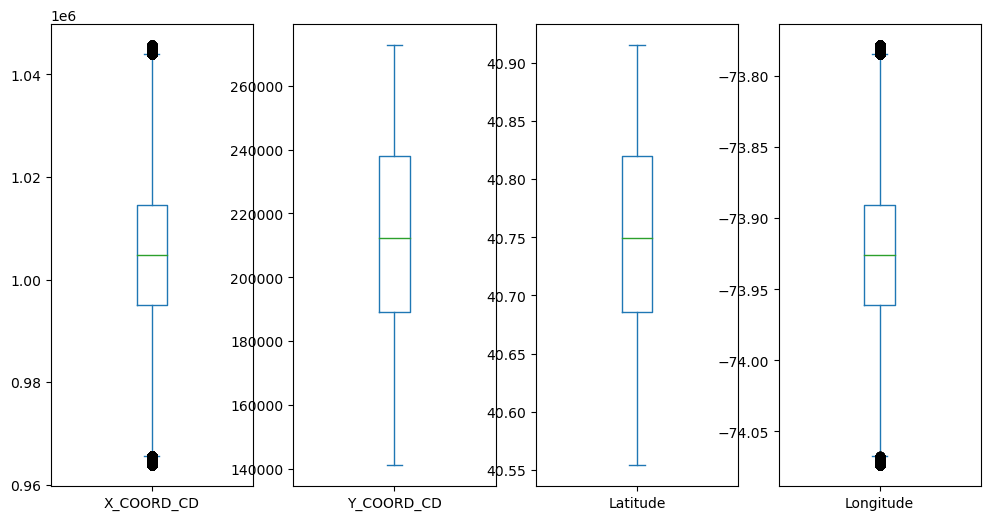

In [47]:
def remove_outliers(df, column):
    Q1 = newCrimeDataNYPD[column].quantile(0.25)
    Q3 = newCrimeDataNYPD[column].quantile(0.75)
    IQR = Q3 - Q1
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR
    return df[(df[column] >= lower_bound) & (df[column] <= upper_bound)]

# Columns to clean
columns_to_clean = ['X_COORD_CD', 'Y_COORD_CD', 'Latitude', 'Longitude']

# Apply the outlier removal function to each column
for column in columns_to_clean:
    newCrimeDataNYPD = remove_outliers(newCrimeDataNYPD, column)
newCrimeDataNYPD[columns_to_clean].plot(kind='box', subplots=True, layout=(1, len(columns_to_clean)), figsize=(12, 6))
# Print the outliers information
for column, info in outliers_info.items():
    print(f"{column} - Outliers lower than {info['lower_bound']}: {info['number_of_outliers']}")
    print(f"{column} - Outliers higher than {info['upper_bound']}: {info['number_of_outliers']}")
plt.show()

In [48]:
# Check the number of records after filtering
crimeDataNYPD.head()
crimeDataNYPD.tail()
newCrimeDataNYPD.head(10)

,ID,Arrest Date,PDcode,PDdesc,KYdesc,OFNS_DESC,Law Code,Law category,BORO_NM,Precinct,...,Susp_Age,Susp_Sex,Susp_Race,X_COORD_CD,Y_COORD_CD,Latitude,Longitude,YEAR,MONTH,DAY_OF_WEEK
1,173114463,2017-12-31,478,311,36,OTHER OFFENSES RELATED TO THEFT,1019,Misdemeanor,Queens,114,...,25-44,Male,ASIAN / PACIFIC ISLANDER,1009113.0,219613.0,40.769437,-73.910241,2017,12,Sunday
2,173113513,2017-12-31,849,211,68,OTHER STATE LAWS,301,Violation,Brooklyn,73,...,18-24,Male,BLACK,1010719.0,186857.0,40.679525,-73.904572,2017,12,Sunday
3,173113423,2017-12-31,101,20,37,ASSAULT 3 & RELATED OFFENSES,386,Misdemeanor,Manhattan,18,...,25-44,Male,WHITE,987831.0,217446.0,40.763523,-73.987074,2017,12,Sunday
4,173113421,2017-12-31,101,20,37,ASSAULT 3 & RELATED OFFENSES,386,Misdemeanor,Manhattan,18,...,45-64,Male,BLACK,987073.0,216078.0,40.759768,-73.989811,2017,12,Sunday
5,173130583,2017-12-31,397,276,4,ROBBERY,965,Felony,Brooklyn,73,...,18-24,Male,BLACK,1007524.0,188555.0,40.684194,-73.916085,2017,12,Sunday
6,173129349,2017-12-31,101,20,37,ASSAULT 3 & RELATED OFFENSES,386,Misdemeanor,Manhattan,9,...,18-24,Female,WHITE HISPANIC,990592.0,202391.0,40.722199,-73.977122,2017,12,Sunday
7,173128438,2017-12-31,511,52,30,DANGEROUS DRUGS,1305,Misdemeanor,Manhattan,25,...,25-44,Male,BLACK,999724.0,230625.0,40.799683,-73.944112,2017,12,Sunday
8,173128437,2017-12-31,101,20,37,ASSAULT 3 & RELATED OFFENSES,386,Misdemeanor,Manhattan,23,...,25-44,Male,BLACK HISPANIC,998165.0,226184.0,40.787496,-73.949752,2017,12,Sunday
9,173128433,2017-12-31,705,104,51,OFFENSES INVOLVING FRAUD,1068,Misdemeanor,Manhattan,17,...,18-24,Male,WHITE,991195.0,212559.0,40.750107,-73.974936,2017,12,Sunday
10,173128430,2017-12-31,101,20,37,ASSAULT 3 & RELATED OFFENSES,387,Misdemeanor,Brooklyn,83,...,25-44,Male,WHITE HISPANIC,1003807.0,195345.0,40.702840,-73.929467,2017,12,Sunday


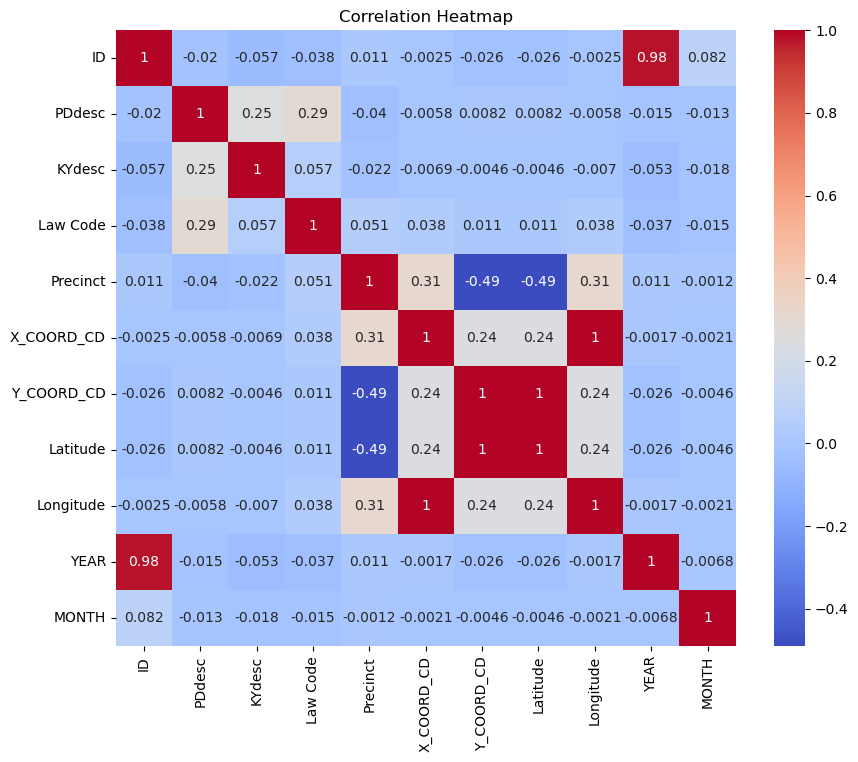

In [49]:
# Select only numeric columns for correlation analysis
numeric_df = crimeDataNYPD.select_dtypes(include=['number'])
# Calculate the correlation matrix
corr_matrix = numeric_df.corr()
# Create the heatmap
plt.figure(figsize=(10, 8))
sns.heatmap(corr_matrix, annot=True, cmap='coolwarm')
plt.title('Correlation Heatmap')
plt.show()

<Axes: ylabel='count'>

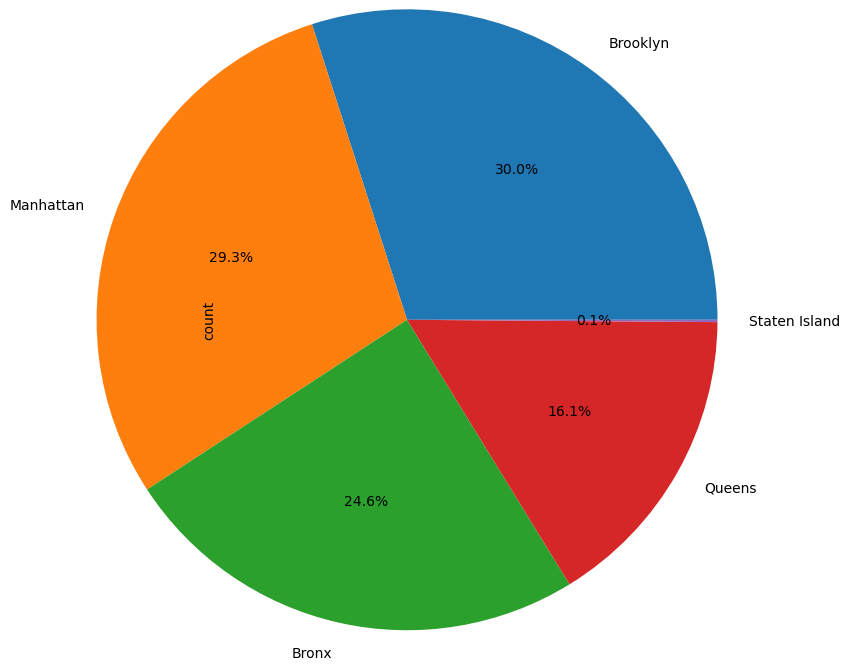

In [50]:
newCrimeDataNYPD['BORO_NM'].value_counts().head(15).plot.pie(radius=2.1, autopct='%1.1f%%', textprops=dict(color="black"))

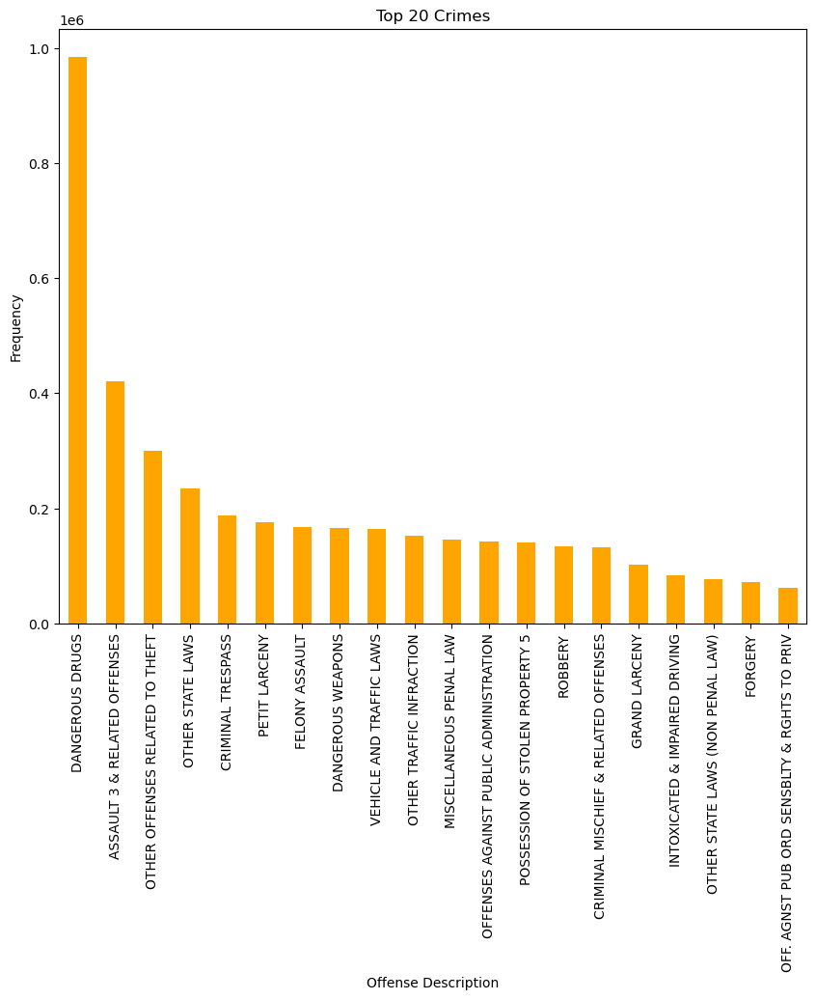

,ID,Arrest Date,PDcode,PDdesc,KYdesc,OFNS_DESC,Law Code,Law category,BORO_NM,Precinct,...,Susp_Age,Susp_Sex,Susp_Race,X_COORD_CD,Y_COORD_CD,Latitude,Longitude,YEAR,MONTH,DAY_OF_WEEK
1,173114463,2017-12-31,478,311,36,OTHER OFFENSES RELATED TO THEFT,1019,Misdemeanor,Queens,114,...,25-44,Male,ASIAN / PACIFIC ISLANDER,1009113.0,219613.0,40.769437,-73.910241,2017,12,Sunday
2,173113513,2017-12-31,849,211,68,OTHER STATE LAWS,301,Violation,Brooklyn,73,...,18-24,Male,BLACK,1010719.0,186857.0,40.679525,-73.904572,2017,12,Sunday
3,173113423,2017-12-31,101,20,37,ASSAULT 3 & RELATED OFFENSES,386,Misdemeanor,Manhattan,18,...,25-44,Male,WHITE,987831.0,217446.0,40.763523,-73.987074,2017,12,Sunday
4,173113421,2017-12-31,101,20,37,ASSAULT 3 & RELATED OFFENSES,386,Misdemeanor,Manhattan,18,...,45-64,Male,BLACK,987073.0,216078.0,40.759768,-73.989811,2017,12,Sunday
5,173130583,2017-12-31,397,276,4,ROBBERY,965,Felony,Brooklyn,73,...,18-24,Male,BLACK,1007524.0,188555.0,40.684194,-73.916085,2017,12,Sunday
6,173129349,2017-12-31,101,20,37,ASSAULT 3 & RELATED OFFENSES,386,Misdemeanor,Manhattan,9,...,18-24,Female,WHITE HISPANIC,990592.0,202391.0,40.722199,-73.977122,2017,12,Sunday
7,173128438,2017-12-31,511,52,30,DANGEROUS DRUGS,1305,Misdemeanor,Manhattan,25,...,25-44,Male,BLACK,999724.0,230625.0,40.799683,-73.944112,2017,12,Sunday
8,173128437,2017-12-31,101,20,37,ASSAULT 3 & RELATED OFFENSES,386,Misdemeanor,Manhattan,23,...,25-44,Male,BLACK HISPANIC,998165.0,226184.0,40.787496,-73.949752,2017,12,Sunday
9,173128433,2017-12-31,705,104,51,OFFENSES INVOLVING FRAUD,1068,Misdemeanor,Manhattan,17,...,18-24,Male,WHITE,991195.0,212559.0,40.750107,-73.974936,2017,12,Sunday
10,173128430,2017-12-31,101,20,37,ASSAULT 3 & RELATED OFFENSES,387,Misdemeanor,Brooklyn,83,...,25-44,Male,WHITE HISPANIC,1003807.0,195345.0,40.702840,-73.929467,2017,12,Sunday


In [51]:
# Count the occurrences of each crime type (Crm Cd Desc)
# Visualize the top 20 crimes
top20_crimes = newCrimeDataNYPD['OFNS_DESC'].value_counts().head(20)
plt.figure(figsize=(10, 8))
top20_crimes.plot(kind='bar',color='orange')
plt.title('Top 20 Crimes')
plt.ylabel('Frequency')
plt.xlabel('Offense Description')
plt.show()
newCrimeDataNYPD.head(10)

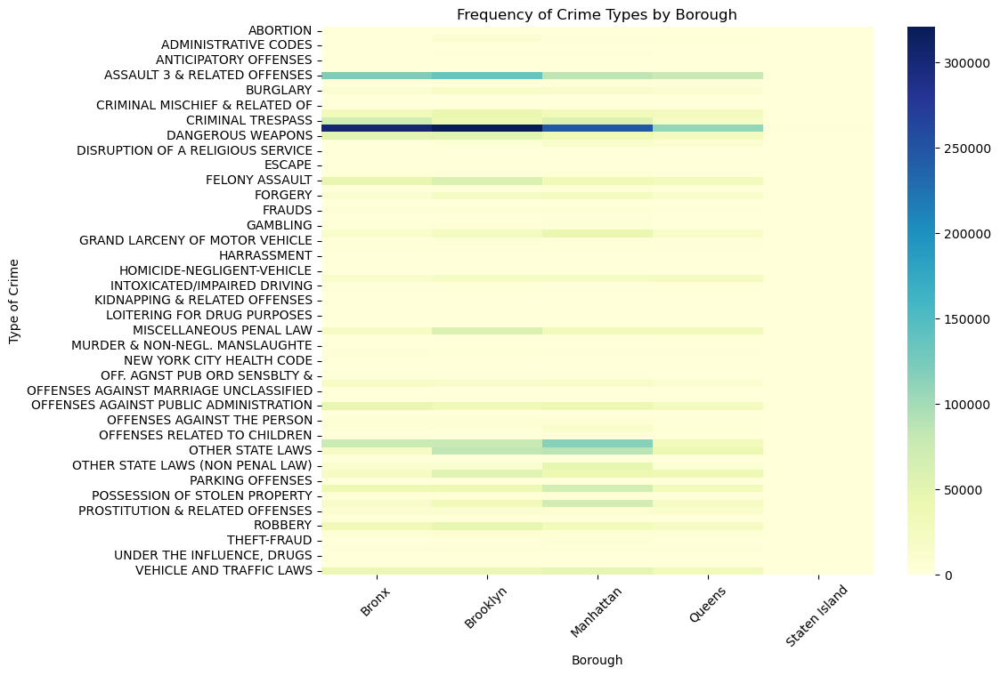

In [52]:
# Creating a cross-tabulation of the frequency of each crime type (OFNS_DESC) in each borough (BORO_NM)
crime_borough_crosstab = pd.crosstab(newCrimeDataNYPD['OFNS_DESC'], newCrimeDataNYPD['BORO_NM'])
# Using a heatmap to visualize the correlation
plt.figure(figsize=(10, 8))
sns.heatmap(crime_borough_crosstab, cmap="YlGnBu", annot=False, cbar=True)
plt.title('Frequency of Crime Types by Borough')
plt.xlabel('Borough')
plt.ylabel('Type of Crime')
plt.xticks(rotation=45)
plt.yticks(rotation=0)
plt.show()

<Axes: ylabel='count'>

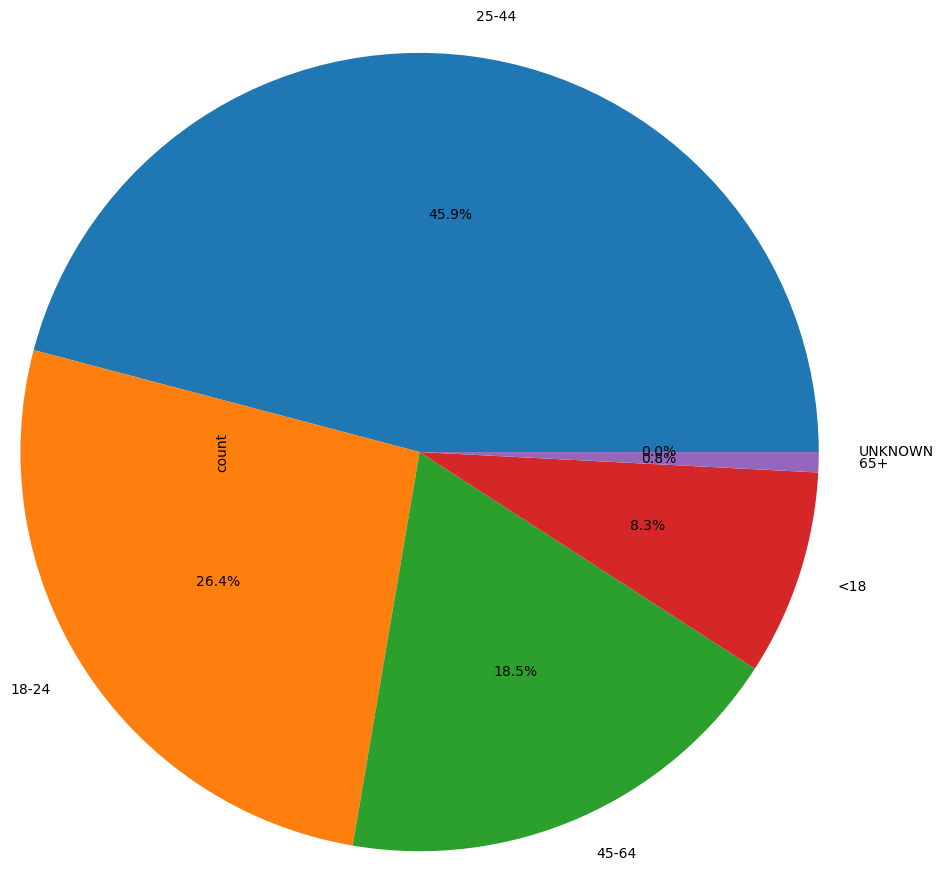

In [53]:
newCrimeDataNYPD['Susp_Age'].value_counts().head(15).plot.pie(radius=2.7, autopct='%1.1f%%', textprops=dict(color="black"))

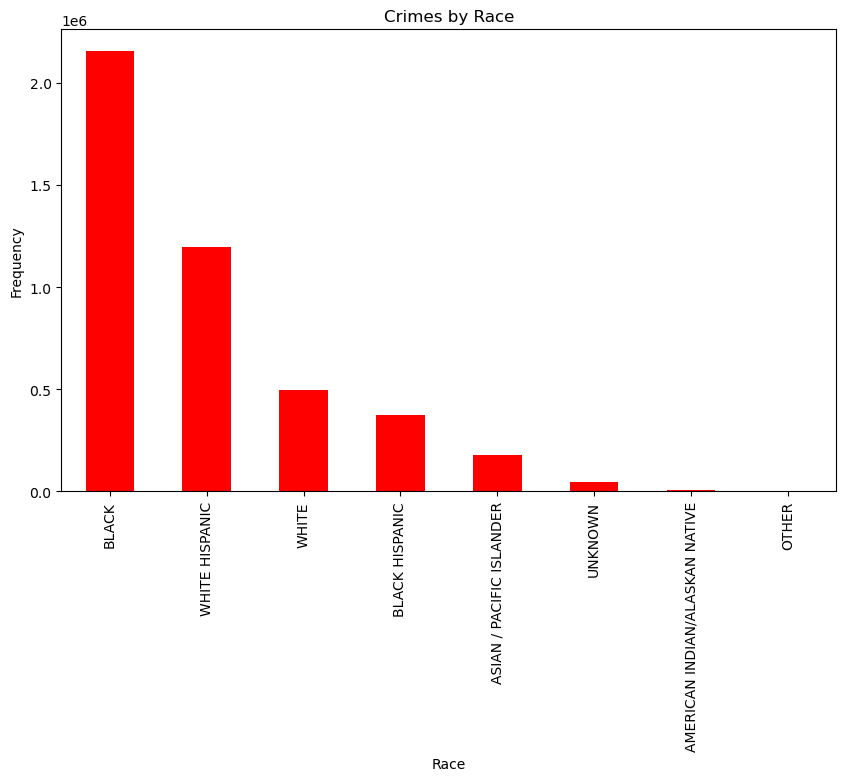

In [54]:
# Distribution of crimes by borough
susp_Race = newCrimeDataNYPD['Susp_Race'].value_counts()
plt.figure(figsize=(10, 6))
susp_Race.plot(kind='bar', color='red')
plt.title('Crimes by Race')
plt.ylabel('Frequency')
plt.xlabel('Race')
plt.show()

Text(0.5, 1.0, 'Distribution of Incident Latitudes')

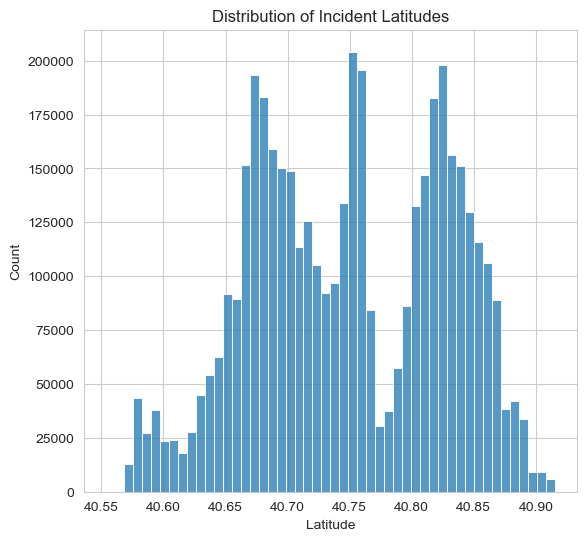

In [55]:
#Data Visualization
# Set the aesthetic style of the plots
sns.set_style("whitegrid")
# Histograms for 'Latitude' and 'Longitude'
plt.figure(figsize=(14, 6))
# Histogram for 'Latitude'
plt.subplot(1, 2, 1)
sns.histplot(newCrimeDataNYPD['Latitude'].dropna(), bins=50, kde=False)
plt.title('Distribution of Incident Latitudes')

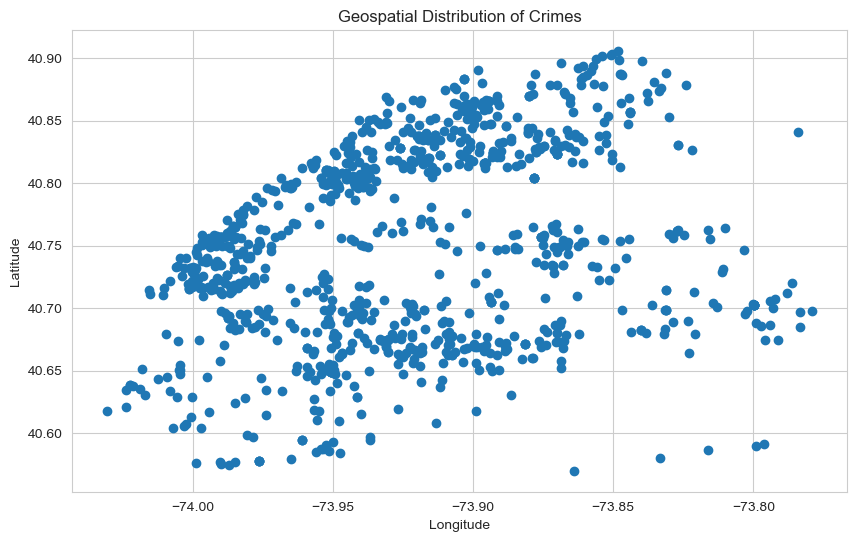

,ID,Arrest Date,PDcode,PDdesc,KYdesc,OFNS_DESC,Law Code,Law category,BORO_NM,Precinct,...,Susp_Age,Susp_Sex,Susp_Race,X_COORD_CD,Y_COORD_CD,Latitude,Longitude,YEAR,MONTH,DAY_OF_WEEK
1,173114463,2017-12-31,478,311,36,OTHER OFFENSES RELATED TO THEFT,1019,Misdemeanor,Queens,114,...,25-44,Male,ASIAN / PACIFIC ISLANDER,1009113.0,219613.0,40.769437,-73.910241,2017,12,Sunday
2,173113513,2017-12-31,849,211,68,OTHER STATE LAWS,301,Violation,Brooklyn,73,...,18-24,Male,BLACK,1010719.0,186857.0,40.679525,-73.904572,2017,12,Sunday
3,173113423,2017-12-31,101,20,37,ASSAULT 3 & RELATED OFFENSES,386,Misdemeanor,Manhattan,18,...,25-44,Male,WHITE,987831.0,217446.0,40.763523,-73.987074,2017,12,Sunday
4,173113421,2017-12-31,101,20,37,ASSAULT 3 & RELATED OFFENSES,386,Misdemeanor,Manhattan,18,...,45-64,Male,BLACK,987073.0,216078.0,40.759768,-73.989811,2017,12,Sunday
5,173130583,2017-12-31,397,276,4,ROBBERY,965,Felony,Brooklyn,73,...,18-24,Male,BLACK,1007524.0,188555.0,40.684194,-73.916085,2017,12,Sunday
6,173129349,2017-12-31,101,20,37,ASSAULT 3 & RELATED OFFENSES,386,Misdemeanor,Manhattan,9,...,18-24,Female,WHITE HISPANIC,990592.0,202391.0,40.722199,-73.977122,2017,12,Sunday
7,173128438,2017-12-31,511,52,30,DANGEROUS DRUGS,1305,Misdemeanor,Manhattan,25,...,25-44,Male,BLACK,999724.0,230625.0,40.799683,-73.944112,2017,12,Sunday
8,173128437,2017-12-31,101,20,37,ASSAULT 3 & RELATED OFFENSES,386,Misdemeanor,Manhattan,23,...,25-44,Male,BLACK HISPANIC,998165.0,226184.0,40.787496,-73.949752,2017,12,Sunday
9,173128433,2017-12-31,705,104,51,OFFENSES INVOLVING FRAUD,1068,Misdemeanor,Manhattan,17,...,18-24,Male,WHITE,991195.0,212559.0,40.750107,-73.974936,2017,12,Sunday
10,173128430,2017-12-31,101,20,37,ASSAULT 3 & RELATED OFFENSES,387,Misdemeanor,Brooklyn,83,...,25-44,Male,WHITE HISPANIC,1003807.0,195345.0,40.702840,-73.929467,2017,12,Sunday


In [56]:
# Dropping rows with NaN or infinite values in 'Longitude' and 'Latitude'
newCrimeDataNYPD = newCrimeDataNYPD.dropna(subset=['Longitude', 'Latitude'])
newCrimeDataNYPD = newCrimeDataNYPD[(newCrimeDataNYPD['Longitude'].notnull()) & (newCrimeDataNYPD['Latitude'].notnull())]

# Data Sampling for Plotting
#Data Visualization
sampled_data = newCrimeDataNYPD.sample(1000) if len(newCrimeDataNYPD) > 1000 else newCrimeDataNYPD

# Plotting using Matplotlib
plt.figure(figsize=(10, 6))
plt.scatter(sampled_data['Longitude'], sampled_data['Latitude'])
plt.title('Geospatial Distribution of Crimes')
plt.xlabel('Longitude')
plt.ylabel('Latitude')
plt.show()
newCrimeDataNYPD.head(10)

Index(['ID', 'Arrest Date', 'PDcode', 'PDdesc', 'KYdesc', 'OFNS_DESC',
       'Law Code', 'Law category', 'BORO_NM', 'Precinct', 'Jurisdiction',
       'Susp_Age', 'Susp_Sex', 'Susp_Race', 'X_COORD_CD', 'Y_COORD_CD',
       'Latitude', 'Longitude', 'YEAR', 'MONTH', 'DAY_OF_WEEK'],
      dtype='object')


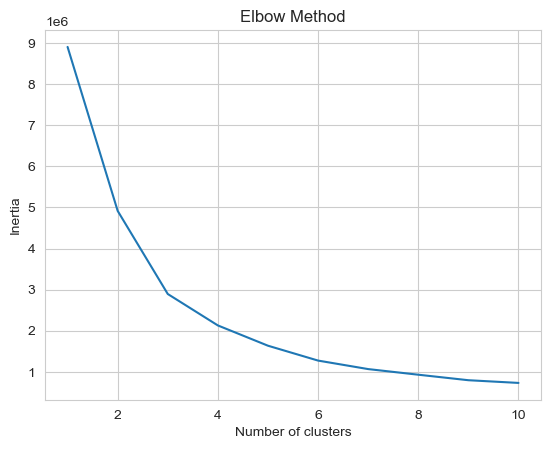

In [57]:
#Clustering
#Selecting relevant features
print(newCrimeDataNYPD.columns)
features = newCrimeDataNYPD[['Latitude', 'Longitude']]

# Handling missing values: Option 1 - dropping rows with missing values
features_cleaned = features.dropna()

# Standardization (if necessary)
scaler = StandardScaler()
features_scaled = scaler.fit_transform(features_cleaned)

# Elbow Method to choose the number of clusters
inertia = []
for i in range(1, 11):  # testing 1 to 10 clusters
    kmeans = KMeans(n_init=10,n_clusters=i, random_state=42)
    kmeans.fit(features_scaled)
    inertia.append(kmeans.inertia_)

plt.plot(range(1, 11), inertia)
plt.title('Elbow Method')
plt.xlabel('Number of clusters')
plt.ylabel('Inertia')
plt.show()

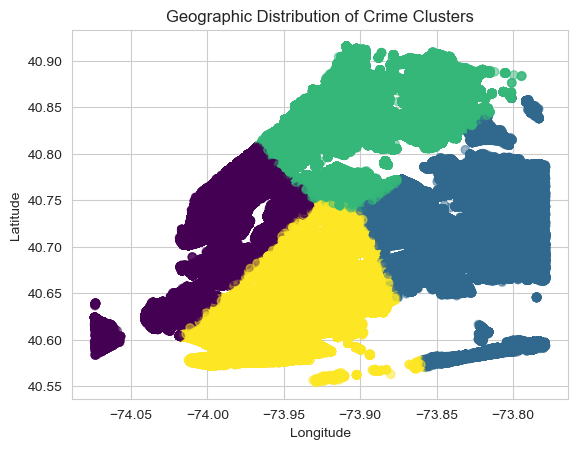

Latitude     float64
Longitude    float64
dtype: object


,ID,Arrest Date,PDcode,PDdesc,KYdesc,OFNS_DESC,Law Code,Law category,BORO_NM,Precinct,...,Susp_Sex,Susp_Race,X_COORD_CD,Y_COORD_CD,Latitude,Longitude,YEAR,MONTH,DAY_OF_WEEK,Cluster
1,173114463,2017-12-31,478,311,36,OTHER OFFENSES RELATED TO THEFT,1019,Misdemeanor,Queens,114,...,Male,ASIAN / PACIFIC ISLANDER,1009113.0,219613.0,40.769437,-73.910241,2017,12,Sunday,2
2,173113513,2017-12-31,849,211,68,OTHER STATE LAWS,301,Violation,Brooklyn,73,...,Male,BLACK,1010719.0,186857.0,40.679525,-73.904572,2017,12,Sunday,3
3,173113423,2017-12-31,101,20,37,ASSAULT 3 & RELATED OFFENSES,386,Misdemeanor,Manhattan,18,...,Male,WHITE,987831.0,217446.0,40.763523,-73.987074,2017,12,Sunday,0
4,173113421,2017-12-31,101,20,37,ASSAULT 3 & RELATED OFFENSES,386,Misdemeanor,Manhattan,18,...,Male,BLACK,987073.0,216078.0,40.759768,-73.989811,2017,12,Sunday,0
5,173130583,2017-12-31,397,276,4,ROBBERY,965,Felony,Brooklyn,73,...,Male,BLACK,1007524.0,188555.0,40.684194,-73.916085,2017,12,Sunday,3
6,173129349,2017-12-31,101,20,37,ASSAULT 3 & RELATED OFFENSES,386,Misdemeanor,Manhattan,9,...,Female,WHITE HISPANIC,990592.0,202391.0,40.722199,-73.977122,2017,12,Sunday,0
7,173128438,2017-12-31,511,52,30,DANGEROUS DRUGS,1305,Misdemeanor,Manhattan,25,...,Male,BLACK,999724.0,230625.0,40.799683,-73.944112,2017,12,Sunday,2
8,173128437,2017-12-31,101,20,37,ASSAULT 3 & RELATED OFFENSES,386,Misdemeanor,Manhattan,23,...,Male,BLACK HISPANIC,998165.0,226184.0,40.787496,-73.949752,2017,12,Sunday,2
9,173128433,2017-12-31,705,104,51,OFFENSES INVOLVING FRAUD,1068,Misdemeanor,Manhattan,17,...,Male,WHITE,991195.0,212559.0,40.750107,-73.974936,2017,12,Sunday,0
10,173128430,2017-12-31,101,20,37,ASSAULT 3 & RELATED OFFENSES,387,Misdemeanor,Brooklyn,83,...,Male,WHITE HISPANIC,1003807.0,195345.0,40.702840,-73.929467,2017,12,Sunday,3


In [58]:
# Apply K-means clustering
kmeans = KMeans(n_clusters=4, init='k-means++', n_init=10, random_state=42)
clusters = kmeans.fit_predict(features_scaled)

# Add the cluster ID to the sampled data
newCrimeDataNYPD['Cluster'] = clusters

# Visualization of clusters using a scatter plot
plt.scatter(newCrimeDataNYPD['Longitude'], newCrimeDataNYPD['Latitude'], c=newCrimeDataNYPD['Cluster'], cmap='viridis', alpha=0.5)
plt.title('Geographic Distribution of Crime Clusters')
plt.xlabel('Longitude')
plt.ylabel('Latitude')
plt.show()
print(sampled_data[['Latitude', 'Longitude']].dtypes)
newCrimeDataNYPD.head(10)

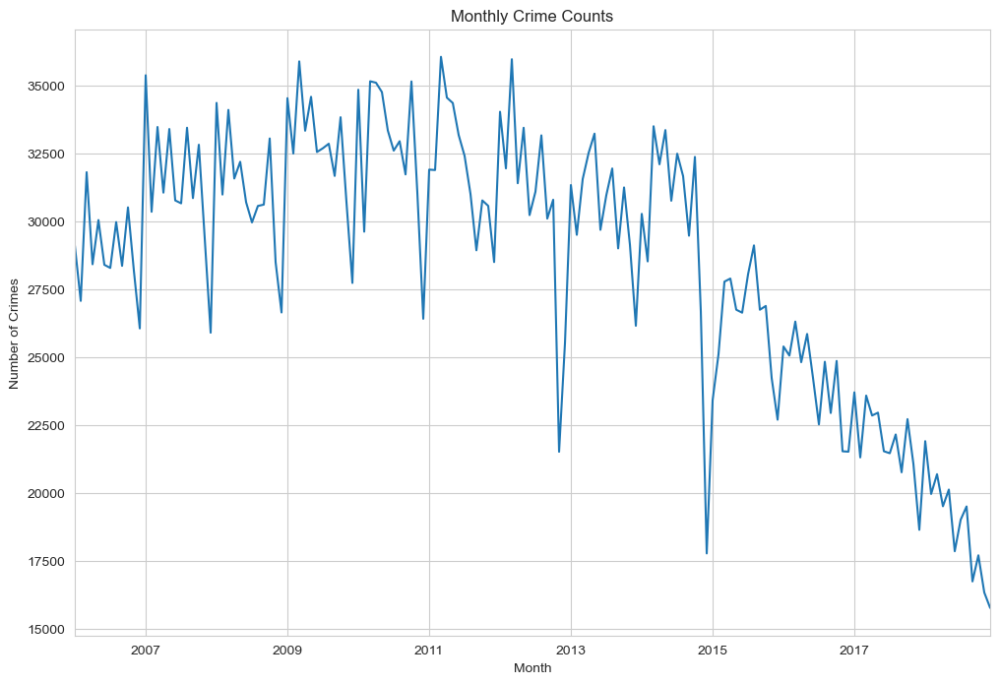

In [59]:
# Convert the 'Arrest Date' column to datetime format and set as index
newCrimeDataNYPD.set_index('Arrest Date', inplace=True)

# Resampling to get monthly crime counts
monthly_crimes = newCrimeDataNYPD.resample('M').size()

# Plotting monthly crime counts
plt.figure(figsize=(12, 8))
monthly_crimes.plot()
plt.title('Monthly Crime Counts')
plt.xlabel('Month')
plt.ylabel('Number of Crimes')
plt.show()

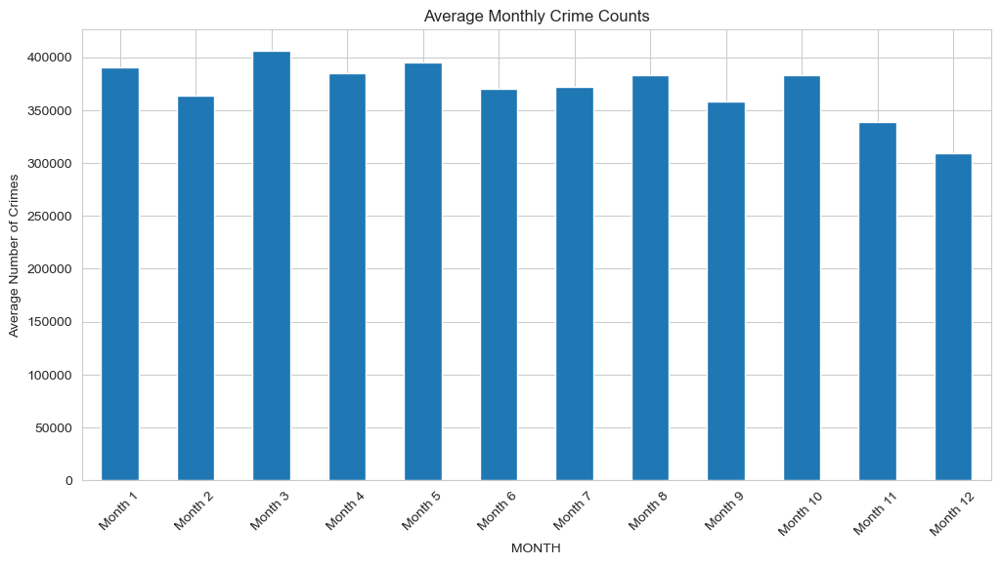

In [60]:
# Seasonality Analysis: Average crime counts by month
# Extract month from the index
newCrimeDataNYPD['MONTH'] = newCrimeDataNYPD.index.month

# Group by month and calculate the average
monthly_avg_crimes = newCrimeDataNYPD.groupby('MONTH').size().groupby('MONTH').mean()

# Plotting average monthly crime counts
plt.figure(figsize=(12, 6))
monthly_avg_crimes.plot(kind='bar')
plt.title('Average Monthly Crime Counts')
plt.xlabel('MONTH')
plt.ylabel('Average Number of Crimes')
plt.xticks(ticks=range(12), labels=[f'Month {i+1}' for i in range(12)], rotation=45)
plt.show()

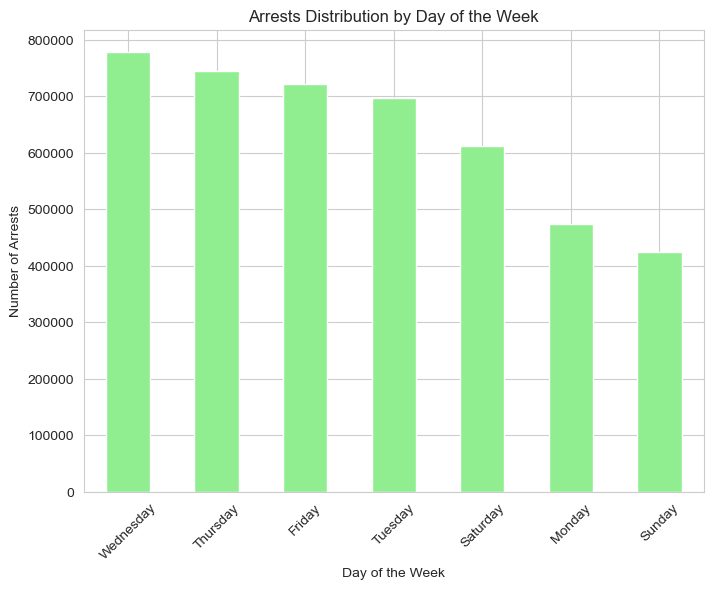

In [61]:
# Day of the Week Analysis: Calculating the total number of arrests for each day of the week
arrests_per_day_of_week = newCrimeDataNYPD['DAY_OF_WEEK'].value_counts()

# Plotting the distribution of arrests across days of the week
plt.figure(figsize=(8, 6))
arrests_per_day_of_week.plot(kind='bar', color='lightgreen')
plt.title('Arrests Distribution by Day of the Week')
plt.xlabel('Day of the Week')
plt.ylabel('Number of Arrests')
plt.xticks(rotation=45)
plt.show()

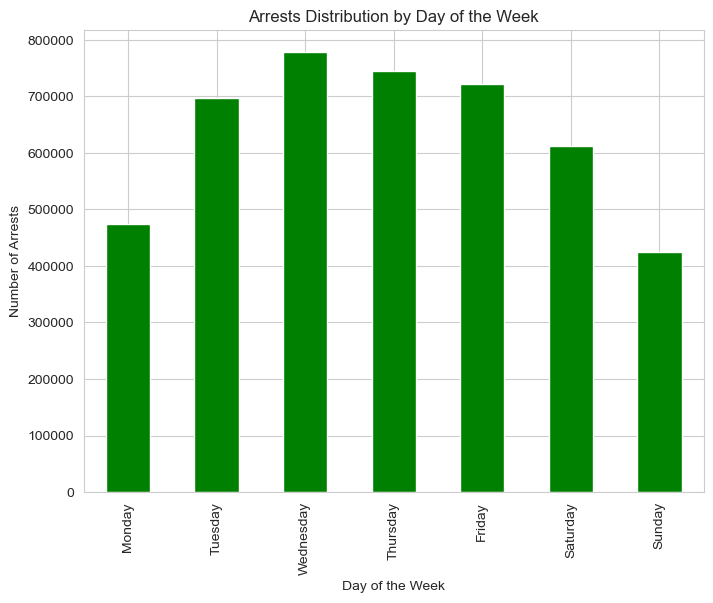

In [62]:
# Day of the Week Analysis: Calculating the total number of arrests for each day of the week
arrests_per_day_of_week = newCrimeDataNYPD['DAY_OF_WEEK'].value_counts()
# Sorting the days of the week in order
sorter = ['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday']
arrests_per_day_of_week = arrests_per_day_of_week.reindex(sorter)

# Plotting the distribution of arrests across days of the week
plt.figure(figsize=(8, 6))
arrests_per_day_of_week.plot(kind='bar', color='green')
plt.title('Arrests Distribution by Day of the Week')
plt.xlabel('Day of the Week')
plt.ylabel('Number of Arrests')

plt.show()

In [63]:

if newCrimeDataNYPD[['Latitude', 'Longitude']].isnull().values.any():
    print("Data contains NaN values.")
if np.isinf(newCrimeDataNYPD[['Latitude', 'Longitude']].values).any():
    print("Data contains infinite values.")

In [64]:
# Drop any rows with NaNs that resulted from the conversion
newCrimeDataNYPD = newCrimeDataNYPD.dropna(subset=['Latitude', 'Longitude'])

In [65]:
newCrimeDataNYPD.head(10)

,ID,PDcode,PDdesc,KYdesc,OFNS_DESC,Law Code,Law category,BORO_NM,Precinct,Jurisdiction,...,Susp_Sex,Susp_Race,X_COORD_CD,Y_COORD_CD,Latitude,Longitude,YEAR,MONTH,DAY_OF_WEEK,Cluster
Arrest Date,,,,,,,,,,,,,,,,,,,,,
2017-12-31,173114463,478,311,36,OTHER OFFENSES RELATED TO THEFT,1019,Misdemeanor,Queens,114,Patrol,...,Male,ASIAN / PACIFIC ISLANDER,1009113.0,219613.0,40.769437,-73.910241,2017,12,Sunday,2
2017-12-31,173113513,849,211,68,OTHER STATE LAWS,301,Violation,Brooklyn,73,Transit,...,Male,BLACK,1010719.0,186857.0,40.679525,-73.904572,2017,12,Sunday,3
2017-12-31,173113423,101,20,37,ASSAULT 3 & RELATED OFFENSES,386,Misdemeanor,Manhattan,18,Patrol,...,Male,WHITE,987831.0,217446.0,40.763523,-73.987074,2017,12,Sunday,0
2017-12-31,173113421,101,20,37,ASSAULT 3 & RELATED OFFENSES,386,Misdemeanor,Manhattan,18,Patrol,...,Male,BLACK,987073.0,216078.0,40.759768,-73.989811,2017,12,Sunday,0
2017-12-31,173130583,397,276,4,ROBBERY,965,Felony,Brooklyn,73,Patrol,...,Male,BLACK,1007524.0,188555.0,40.684194,-73.916085,2017,12,Sunday,3
2017-12-31,173129349,101,20,37,ASSAULT 3 & RELATED OFFENSES,386,Misdemeanor,Manhattan,9,Patrol,...,Female,WHITE HISPANIC,990592.0,202391.0,40.722199,-73.977122,2017,12,Sunday,0
2017-12-31,173128438,511,52,30,DANGEROUS DRUGS,1305,Misdemeanor,Manhattan,25,Patrol,...,Male,BLACK,999724.0,230625.0,40.799683,-73.944112,2017,12,Sunday,2
2017-12-31,173128437,101,20,37,ASSAULT 3 & RELATED OFFENSES,386,Misdemeanor,Manhattan,23,Housing,...,Male,BLACK HISPANIC,998165.0,226184.0,40.787496,-73.949752,2017,12,Sunday,2
2017-12-31,173128433,705,104,51,OFFENSES INVOLVING FRAUD,1068,Misdemeanor,Manhattan,17,Patrol,...,Male,WHITE,991195.0,212559.0,40.750107,-73.974936,2017,12,Sunday,0


In [66]:
newCrimeDataNYPD.dtypes

ID                 int64
PDcode            object
PDdesc             int64
KYdesc             int64
OFNS_DESC       category
Law Code           int64
Law category    category
BORO_NM           object
Precinct           int64
Jurisdiction      object
Susp_Age          object
Susp_Sex          object
Susp_Race         object
X_COORD_CD       float64
Y_COORD_CD       float64
Latitude         float64
Longitude        float64
YEAR               int32
MONTH              int32
DAY_OF_WEEK       object
Cluster            int32
dtype: object

In [67]:
newCrimeDataNYPD.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 4454564 entries, 2017-12-31 to 2018-01-01
Data columns (total 21 columns):
 #   Column        Dtype   
---  ------        -----   
 0   ID            int64   
 1   PDcode        object  
 2   PDdesc        int64   
 3   KYdesc        int64   
 4   OFNS_DESC     category
 5   Law Code      int64   
 6   Law category  category
 7   BORO_NM       object  
 8   Precinct      int64   
 9   Jurisdiction  object  
 10  Susp_Age      object  
 11  Susp_Sex      object  
 12  Susp_Race     object  
 13  X_COORD_CD    float64 
 14  Y_COORD_CD    float64 
 15  Latitude      float64 
 16  Longitude     float64 
 17  YEAR          int32   
 18  MONTH         int32   
 19  DAY_OF_WEEK   object  
 20  Cluster       int32   
dtypes: category(2), float64(4), int32(3), int64(5), object(7)
memory usage: 637.2+ MB


In [68]:
label_encoder = LabelEncoder()
newCrimeDataNYPD['BORO_NM'] = label_encoder.fit_transform(newCrimeDataNYPD['BORO_NM'])
newCrimeDataNYPD['OFNS_DESC'] = label_encoder.fit_transform(newCrimeDataNYPD['OFNS_DESC'])
newCrimeDataNYPD.info()
newCrimeDataNYPD = newCrimeDataNYPD.dropna(subset=['DAY_OF_WEEK', 'MONTH','Precinct','Jurisdiction'])
newCrimeDataNYPD.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 4454564 entries, 2017-12-31 to 2018-01-01
Data columns (total 21 columns):
 #   Column        Dtype   
---  ------        -----   
 0   ID            int64   
 1   PDcode        object  
 2   PDdesc        int64   
 3   KYdesc        int64   
 4   OFNS_DESC     int64   
 5   Law Code      int64   
 6   Law category  category
 7   BORO_NM       int64   
 8   Precinct      int64   
 9   Jurisdiction  object  
 10  Susp_Age      object  
 11  Susp_Sex      object  
 12  Susp_Race     object  
 13  X_COORD_CD    float64 
 14  Y_COORD_CD    float64 
 15  Latitude      float64 
 16  Longitude     float64 
 17  YEAR          int32   
 18  MONTH         int32   
 19  DAY_OF_WEEK   object  
 20  Cluster       int32   
dtypes: category(1), float64(4), int32(3), int64(7), object(6)
memory usage: 667.0+ MB
<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 4454564 entries, 2017-12-31 to 2018-01-01
Data columns (total 21 columns):
 #   Column  

In [69]:
newCrimeDataNYPD.shape

(4454564, 21)

In [70]:
# Assuming 'OFNS_DESC' is your target variable and newCrimeDataNYPD is your DataFrame
label_encoder = LabelEncoder()
y_encoded = label_encoder.fit_transform(newCrimeDataNYPD['OFNS_DESC'])

# Compute class weights for all classes
weights = class_weight.compute_class_weight('balanced', classes=np.unique(y_encoded), y=y_encoded)
class_weights = dict(enumerate(weights))

In [71]:
# Sampling a subset of the data to reduce memory usage
sampled_data = newCrimeDataNYPD.sample(frac=0.7, random_state=42)  # Taking 70% of the data
# Selecting features and target variable from the sampled data
X_sampled = sampled_data[['BORO_NM']]  # Note the double brackets to keep it in DataFrame format
y_sampled = sampled_data['OFNS_DESC']

# Splitting the sampled dataset into training and test sets
X_train_sampled, X_test_sampled, y_train_sampled, y_test_sampled = train_test_split(
    X_sampled, y_sampled, test_size=0.3, random_state=42
)
# Defining the preprocessor
preprocessor = ColumnTransformer(
    transformers=[
        ('cat', OneHotEncoder(), ['BORO_NM'])
    ]
)
# Creating a pipeline for the RandomForestClassifier
pipeline_sampled = Pipeline(steps=[
    ('preprocessor', preprocessor),
    ('classifier', RandomForestClassifier(n_estimators=10, random_state=42))
])
# Training the RandomForest model on the sampled data
pipeline_sampled.fit(X_train_sampled, y_train_sampled)
# Making predictions on the test set and evaluating the model
y_pred_sampled = pipeline_sampled.predict(X_test_sampled)
classification_report_sampled = classification_report(y_test_sampled, y_pred_sampled)

print(classification_report_sampled)

/Users/jishasheelakumar/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/Users/jishasheelakumar/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


              precision    recall  f1-score   support

           0       0.00      0.00      0.00         1
           1       0.00      0.00      0.00      2802
           2       0.00      0.00      0.00        21
           3       0.00      0.00      0.00       985
           4       0.00      0.00      0.00       139
           5       0.00      0.00      0.00       348
           6       0.00      0.00      0.00     88717
           7       0.00      0.00      0.00      1305
           8       0.00      0.00      0.00     11725
           9       0.00      0.00      0.00        90
          10       0.00      0.00      0.00       340
          11       0.00      0.00      0.00     27549
          12       0.00      0.00      0.00     39166
          13       0.22      1.00      0.36    206157
          14       0.00      0.00      0.00     34901
          15       0.00      0.00      0.00      5940
          16       0.00      0.00      0.00         8
          17       0.00    

/Users/jishasheelakumar/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


In [72]:
newCrimeDataNYPD.dtypes

ID                 int64
PDcode            object
PDdesc             int64
KYdesc             int64
OFNS_DESC          int64
Law Code           int64
Law category    category
BORO_NM            int64
Precinct           int64
Jurisdiction      object
Susp_Age          object
Susp_Sex          object
Susp_Race         object
X_COORD_CD       float64
Y_COORD_CD       float64
Latitude         float64
Longitude        float64
YEAR               int32
MONTH              int32
DAY_OF_WEEK       object
Cluster            int32
dtype: object

In [73]:
newCrimeDataNYPD.tail()

,ID,PDcode,PDdesc,KYdesc,OFNS_DESC,Law Code,Law category,BORO_NM,Precinct,Jurisdiction,...,Susp_Sex,Susp_Race,X_COORD_CD,Y_COORD_CD,Latitude,Longitude,YEAR,MONTH,DAY_OF_WEEK,Cluster
Arrest Date,,,,,,,,,,,,,,,,,,,,,
2018-01-01,173142136,639,10,54,47,1501,Misdemeanor,0,41,Patrol,...,Female,WHITE HISPANIC,1013086.0,236614.0,40.816088,-73.895824,2018,1,Monday,2
2018-01-01,173135232,109,19,5,20,412,Felony,0,44,Patrol,...,Male,BLACK HISPANIC,1007649.0,243339.0,40.834562,-73.915443,2018,1,Monday,2
2018-01-01,173134328,397,276,4,66,987,Felony,2,10,Patrol,...,Male,BLACK,983620.0,208914.0,40.740105,-74.002275,2018,1,Monday,0
2018-01-01,173134322,922,317,41,72,2067,Misdemeanor,2,30,Patrol,...,Male,BLACK HISPANIC,998981.0,242209.0,40.831479,-73.946770,2018,1,Monday,2
2018-01-01,173130592,109,19,5,20,423,Felony,1,70,Patrol,...,Male,BLACK HISPANIC,995824.0,170921.0,40.635816,-73.958301,2018,1,Monday,3


In [74]:
# Filter and convert types if necessary
hm_pol = newCrimeDataNYPD[newCrimeDataNYPD['Jurisdiction'] == 'Transit']
if hm_pol['Latitude'].dtype != 'float':
    hm_pol['Latitude'] = hm_pol['Latitude'].astype(float)
if hm_pol['Longitude'].dtype != 'float':
    hm_pol['Longitude'] = hm_pol['Longitude'].astype(float)

# Remove NaN values
hm_pol = hm_pol.dropna(subset=['Latitude', 'Longitude'])

# Create a map centered around an average location of the filtered data
m = folium.Map(location=[hm_pol['Latitude'].mean(), hm_pol['Longitude'].mean()], zoom_start=11)
# Create heat map data using list comprehension
heat_data = [[lat, lon] for lat, lon in zip(hm_pol['Latitude'], hm_pol['Longitude'])]
# Add HeatMap to the map
HeatMap(heat_data).add_to(m)

# Display the map
m
